In [ ]:
from google.colab import drive

In [ ]:
# Mounting to google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
% cd /content/drive/MyDrive/Georgia Tech/Machine Learning-CS7641/Assignments/Assignment #1/Loan_Model_DT

/content/drive/MyDrive/Georgia Tech/Machine Learning-CS7641/Assignments/Assignment #1/Loan_Model_DT


In [ ]:
import pandas as pd

df = pd.read_excel('Bank_Personal_Loan_Modelling.xlsx', sheet_name= 'Data')

In [ ]:
df.head(10)

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
5,6,37,13,29,92121,4,0.4,2,155,0,0,0,1,0
6,7,53,27,72,91711,2,1.5,2,0,0,0,0,1,0
7,8,50,24,22,93943,1,0.3,3,0,0,0,0,0,1
8,9,35,10,81,90089,3,0.6,2,104,0,0,0,1,0
9,10,34,9,180,93023,1,8.9,3,0,1,0,0,0,0


In [ ]:
X = df.drop(['Personal Loan', 'ID', 'ZIP Code', 'Age'], axis=1)
y = df['Personal Loan']

In [ ]:
X.describe().T

,count,mean,std,min,25%,50%,75%,max
Experience,5000.0,20.104600,11.467954,-3.0,10.0,20.0,30.0,43.0
Income,5000.0,73.774200,46.033729,8.0,39.0,64.0,98.0,224.0
Family,5000.0,2.396400,1.147663,1.0,1.0,2.0,3.0,4.0
CCAvg,5000.0,1.937913,1.747666,0.0,0.7,1.5,2.5,10.0
Education,5000.0,1.881000,0.839869,1.0,1.0,2.0,3.0,3.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.0,0.0,101.0,635.0
Securities Account,5000.0,0.104400,0.305809,0.0,0.0,0.0,0.0,1.0
CD Account,5000.0,0.060400,0.238250,0.0,0.0,0.0,0.0,1.0
Online,5000.0,0.596800,0.490589,0.0,0.0,1.0,1.0,1.0
CreditCard,5000.0,0.294000,0.455637,0.0,0.0,0.0,1.0,1.0


There is a certain variation to the k-Means algorithm, called k-Modes which is suitable for data with categorical features. k-Prototype is an extension of the k-Modes algorithm that works for mixed categorical and numerical features.
What is k-Modes and k-Prototype Algorithm:
k-Modes is an algorithm that is based on the k-Means algorithm paradigm and it is used for clustering categorical data. k-modes defines clusters based on matching categories between the data points. The k-Prototype algorithm is an extension to the k-Modes algorithm that combines the k-modes and k-means algorithms and is able to cluster mixed numerical and categorical variables.

In [ ]:
!pip install kmodes

In [ ]:
X.dtypes

Experience              int64
Income                  int64
Family                  int64
CCAvg                 float64
Education               int64
Mortgage                int64
Securities Account      int64
CD Account              int64
Online                  int64
CreditCard              int64
dtype: object

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe550307cd0>,
      dtype=object)

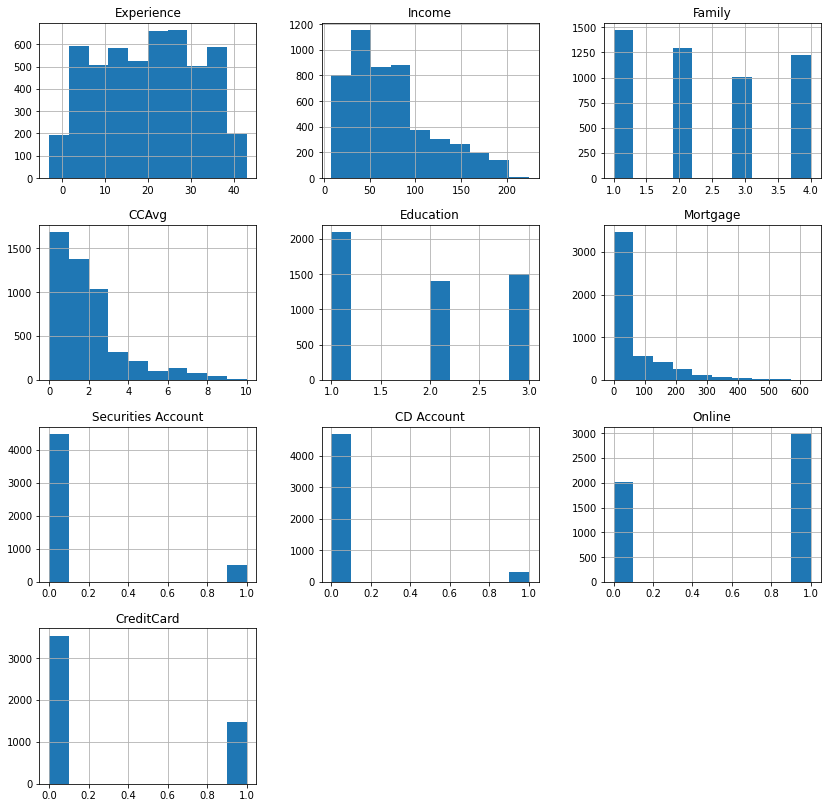

In [ ]:
X.hist(figsize=(14,14))

In [ ]:
# Categorical Variables
x_cat = ['Family', 'Education', 'Securities Account', 'CD Account', 'Online',
         'CreditCard']
x_cat_pos = [X.columns.get_loc(col) for col in x_cat]
print(f'Categorical column position are: {x_cat_pos}')

Categorical column position are: [2, 4, 6, 7, 8, 9]


In [ ]:
# K-Prototype requires Matrix for input

X_matrix = X.to_numpy()
X_matrix

array([[ 1., 49.,  4., ...,  0.,  0.,  0.],
       [19., 34.,  3., ...,  0.,  0.,  0.],
       [15., 11.,  1., ...,  0.,  0.,  0.],
       ...,
       [39., 24.,  2., ...,  0.,  0.,  0.],
       [40., 49.,  3., ...,  0.,  1.,  0.],
       [ 4., 83.,  3., ...,  0.,  1.,  1.]])

For 2 number of clusters, the average Silhouette score is 0.6239537685737673
For 3 number of clusters, the average Silhouette score is 0.5874616481808355
For 4 number of clusters, the average Silhouette score is 0.534679881992767
For 5 number of clusters, the average Silhouette score is 0.5396077207335431
For 6 number of clusters, the average Silhouette score is 0.4656224910640512
For 7 number of clusters, the average Silhouette score is 0.4581519377509452
For 8 number of clusters, the average Silhouette score is 0.4654186578167961
For 9 number of clusters, the average Silhouette score is 0.44306837097386925
For 10 number of clusters, the average Silhouette score is 0.43131330614418967


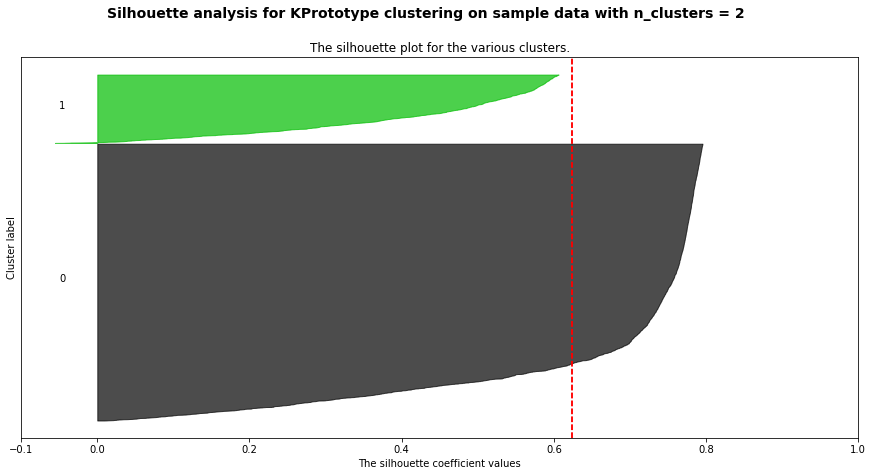

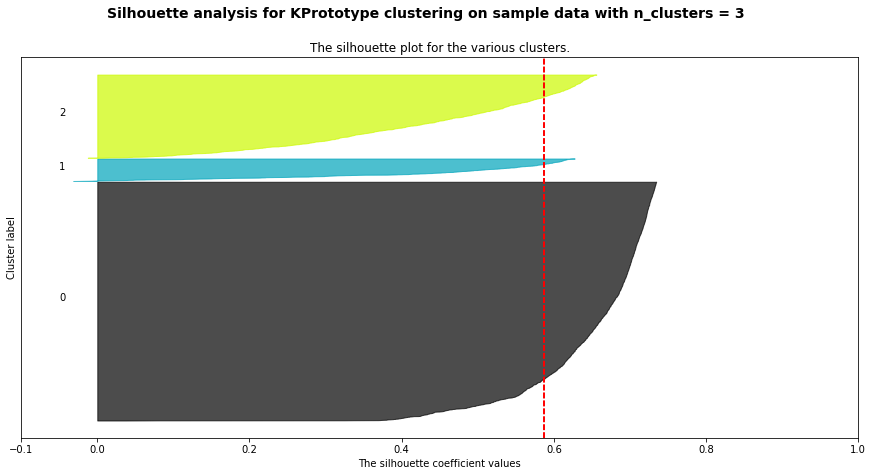

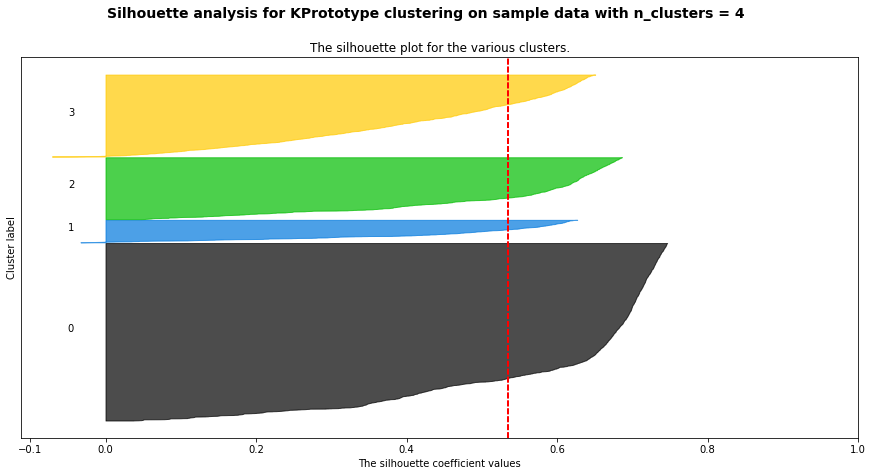

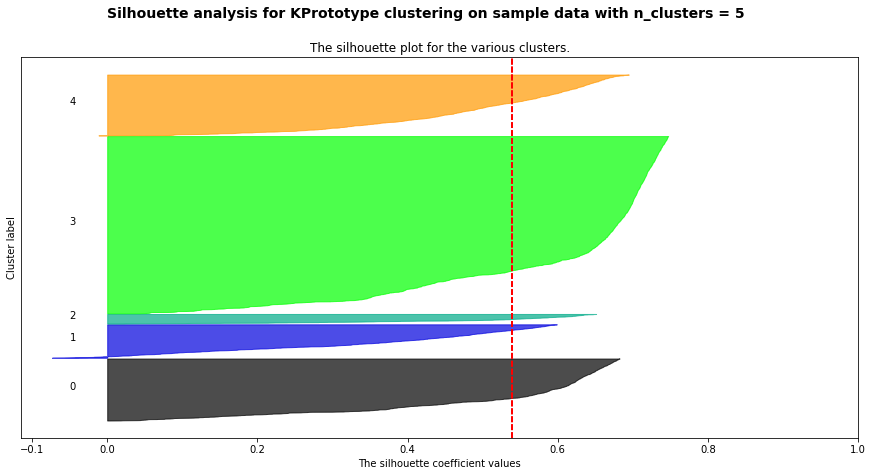

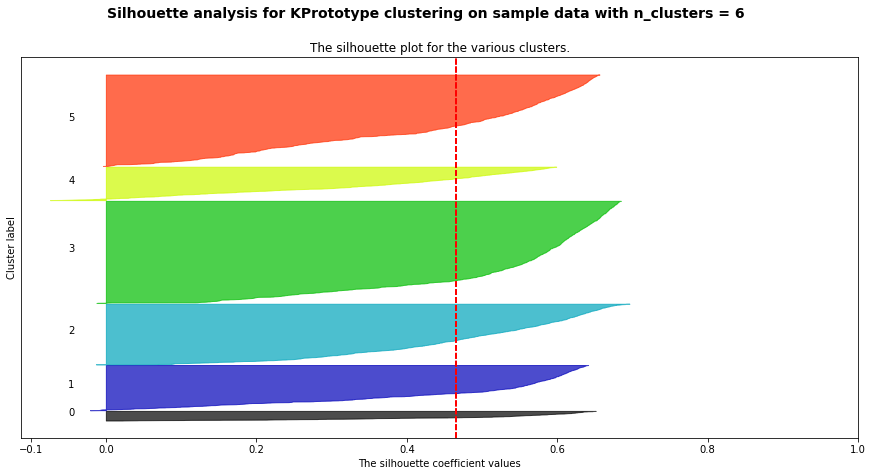

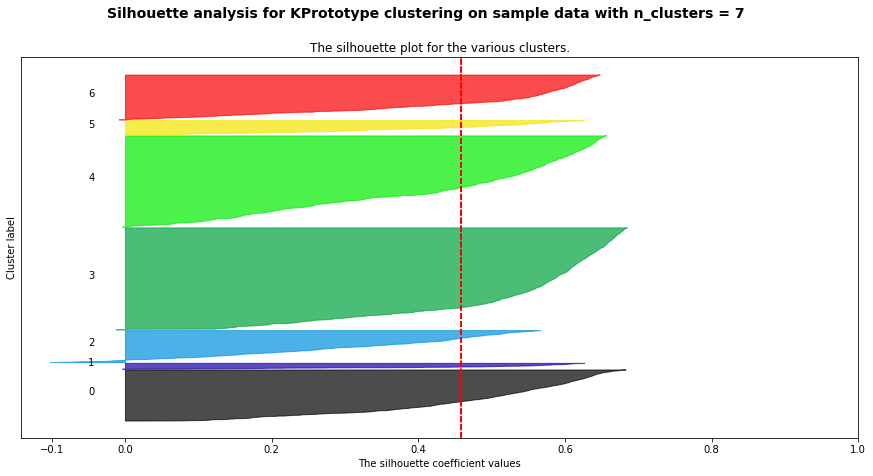

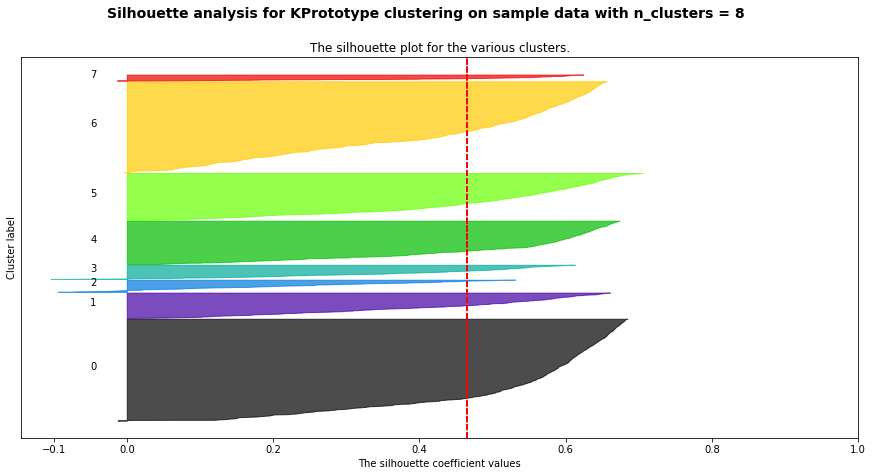

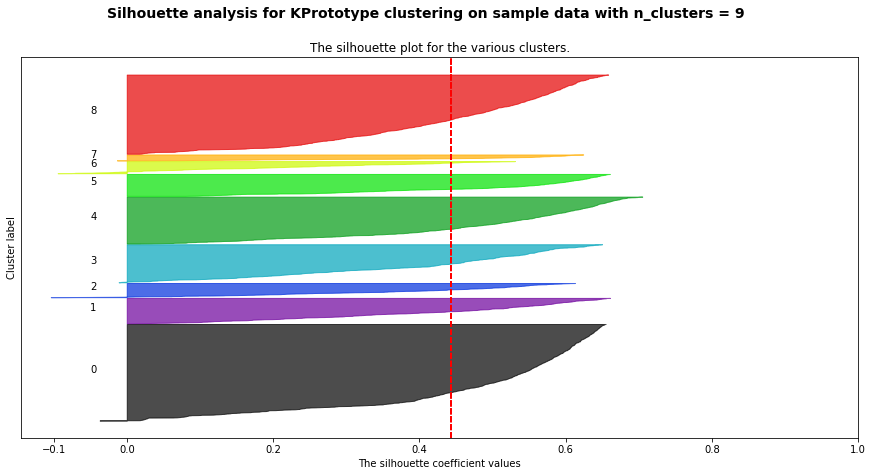

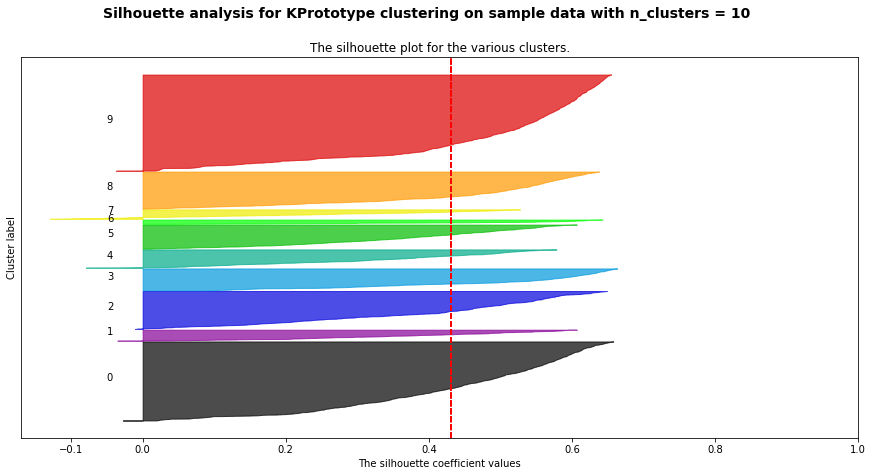

In [ ]:
from kmodes import kprototypes
#Choose optimal K using Elbow and silohouette methods
from kmodes.kprototypes import KPrototypes
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import matplotlib.style as style


elbow_lost = []
silhouette_avg_list = []

for cluster in range(2, 11):

    fig, ax1 = plt.subplots()
    fig.set_size_inches(15, 7)

    kprototype = KPrototypes(n_jobs= -1, n_clusters= cluster, init = 'Huang',
                             random_state= 0)
    cluster_labels = kprototype.fit_predict(X_matrix, categorical = x_cat_pos)
    #The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    #clusters

    silhouette_avg = silhouette_score(X_matrix, cluster_labels)
    silhouette_avg_list.append(silhouette_avg)
    elbow_lost.append(kprototype.cost_)
    print(f'For {cluster} number of clusters, the average Silhouette score is {silhouette_avg}')

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(cluster):
      # Aggregate the silhouette scores for samples belonging to
      # cluster i, and sort them
      ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

      ith_cluster_silhouette_values.sort()

      size_cluster_i = ith_cluster_silhouette_values.shape[0]
      y_upper = y_lower + size_cluster_i

      color = cm.nipy_spectral(float(i) / cluster)
      ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

      # Label the silhouette plots with their cluster numbers at the middle
      ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

      # Compute the new y_lower for next plot
      y_lower = y_upper + 10  # 10 for the 0 samples

      ax1.set_title("The silhouette plot for the various clusters.")
      ax1.set_xlabel("The silhouette coefficient values")
      ax1.set_ylabel("Cluster label")

      # The vertical line for average silhouette score of all the values
      ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

      ax1.set_yticks([])  # Clear the yaxis labels / ticks
      ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
      plt.suptitle(("Silhouette analysis for KPrototype clustering on sample data "
                  "with n_clusters = %d" % cluster),
                  fontsize=14, fontweight='bold')
      plt.subplots_adjust(hspace=0.4)


plt.show()

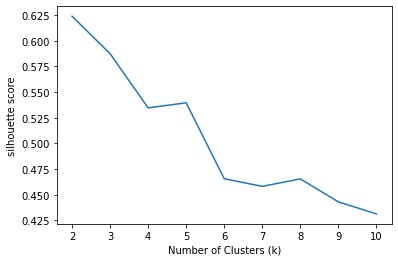

In [ ]:
plt.plot(range(2,11), silhouette_avg_list)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("silhouette score")
plt.show()

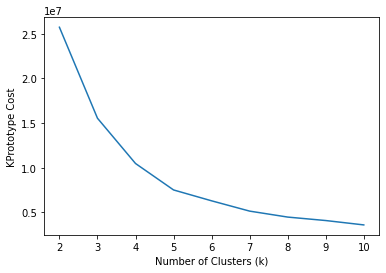

In [ ]:
plt.plot(range(2,11), elbow_lost)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("KPrototype Cost")
plt.show()

In [ ]:
# Choosing K = 5 according to silhouette and Elbow method

kprototype_optimal = KPrototypes(n_jobs= -1, n_clusters= 5, init = 'Huang',
                                random_state = 0)
kprototype_optimal.fit_predict(X_matrix, categorical = x_cat_pos)

array([3, 3, 3, ..., 3, 3, 3], dtype=uint16)

In [ ]:
# Adding labels to X data-set
X['Cluster Labels'] = kprototype_optimal.labels_

In [ ]:
X['Cluster Labels'].value_counts()

3    2581
0     904
4     886
1     488
2     141
Name: Cluster Labels, dtype: int64

In [ ]:
X.columns

Index(['Experience', 'Income', 'Family', 'CCAvg', 'Education', 'Mortgage',
       'Securities Account', 'CD Account', 'Online', 'CreditCard',
       'Cluster Labels'],
      dtype='object')

In [ ]:
# Intrepratation of each cluster, by taking means for continous variables and mode for categorical variables
X['Total'] = X['Cluster Labels']
X.groupby('Cluster Labels').agg(
  {
    'Experience': 'mean',
    'Income': 'mean',
    'Family': lambda x: x.value_counts().index[0],
    'CCAvg': 'mean',
    'Education': lambda x: x.value_counts().index[0],
    'Mortgage': 'mean',
    'Securities Account': lambda x: x.value_counts().index[0],
    'CD Account': lambda x: x.value_counts().index[0],
    'Online': lambda x: x.value_counts().index[0],
    'CreditCard': lambda x: x.value_counts().index[0],
    'Total': 'count'
  }
).reset_index()

,Cluster Labels,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,Total
0,0,19.498894,139.414823,1,3.608628,1,2.439159,0,0,1,0,904
1,1,19.463115,95.747951,1,2.429508,1,234.014344,0,0,1,0,488
2,2,20.510638,151.475177,2,3.609929,1,424.475177,0,0,1,0,141
3,3,20.405657,51.663309,4,1.387602,1,0.000000,0,0,1,0,2581
4,4,20.134312,46.742664,4,1.299511,1,119.908578,0,0,1,0,886


In [ ]:
#Choosing decisive features for visuallization

X_kp_vis = X[['Income', 'Family', 'CCAvg', 'Mortgage', 'Cluster Labels']]

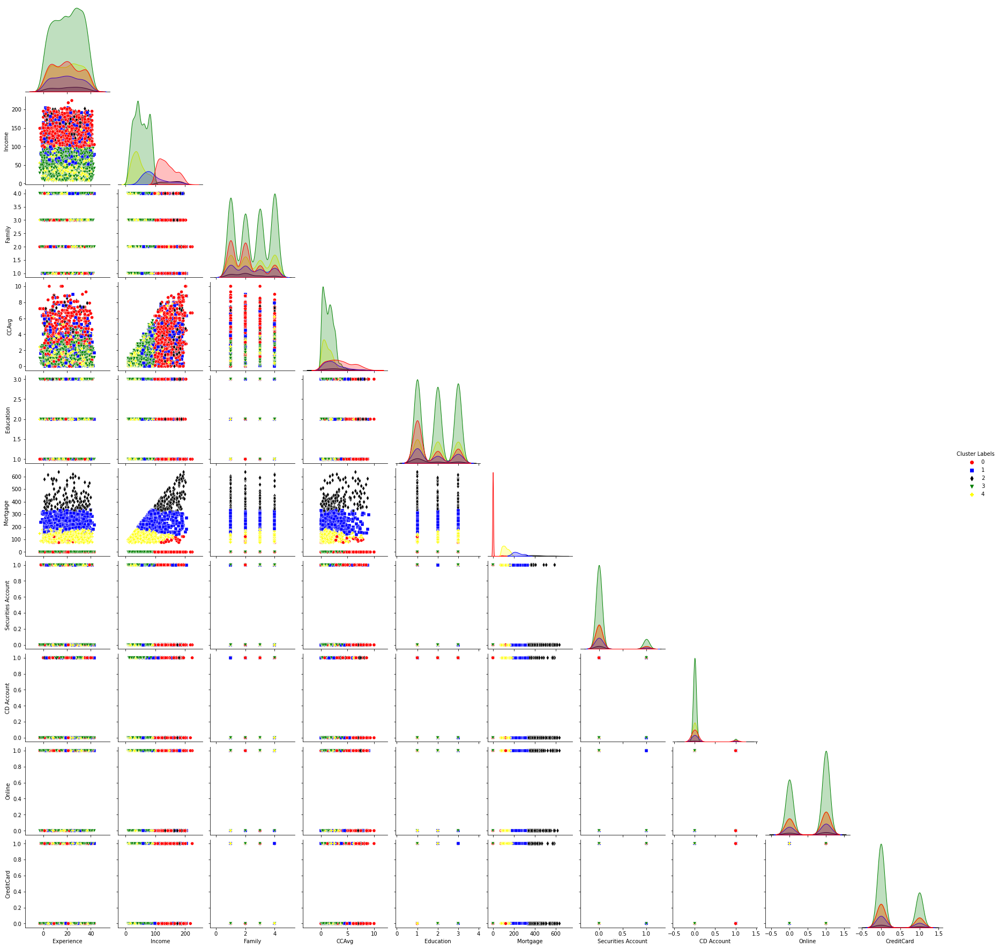

In [ ]:
import seaborn as sns

sns.pairplot(X.drop(['Total'], axis=1), hue = 'Cluster Labels', palette= ['r', 'blue', 'black', 'g', 'yellow'], markers=['o', 's', 'd', 'v', 'P'], corner = True)

In [ ]:
X_em = df.drop(['Personal Loan', 'ID', 'ZIP Code', 'Age',
                'Securities Account', 'CD Account', 'Online', 'CreditCard'], axis=1)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe54d7b29d0>,
      dtype=object)

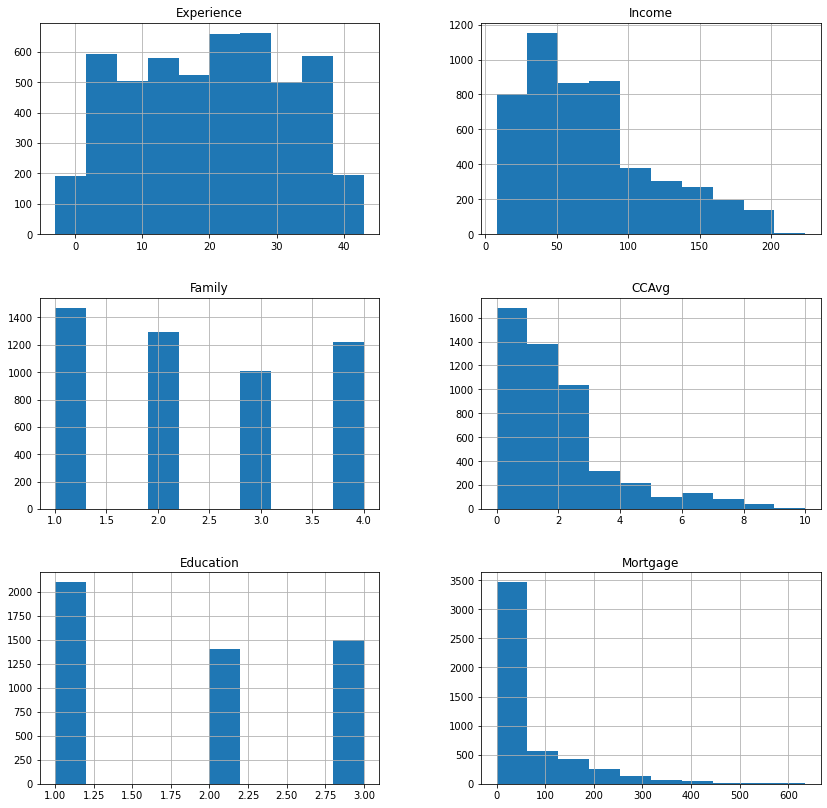

In [ ]:
X_em.hist(figsize = (14,14))

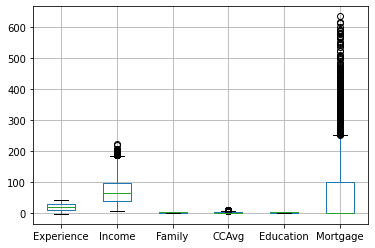

In [ ]:
X_em.boxplot()

In [ ]:
normal_col = ['Experience', 'Family', 'Education']
skewd_col = ['CCAvg', 'Income', 'Mortgage']

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.compose import ColumnTransformer

normal_pipeline = Pipeline(steps = [('scale', StandardScaler())])
skewd_pipline = Pipeline(steps = [('sk_scale', RobustScaler())])

full_preprocessor = ColumnTransformer(transformers=[
        ('normal_transform', normal_pipeline, normal_col),
        ('skewd_transform', skewd_pipline, skewd_col)], remainder ='passthrough')

X_em_stand = full_preprocessor.fit_transform(X_em)

df_X_em_stand = pd.DataFrame(X_em_stand, columns= X_em.columns)

In [ ]:
# df_X_em_stand = X_em.copy()

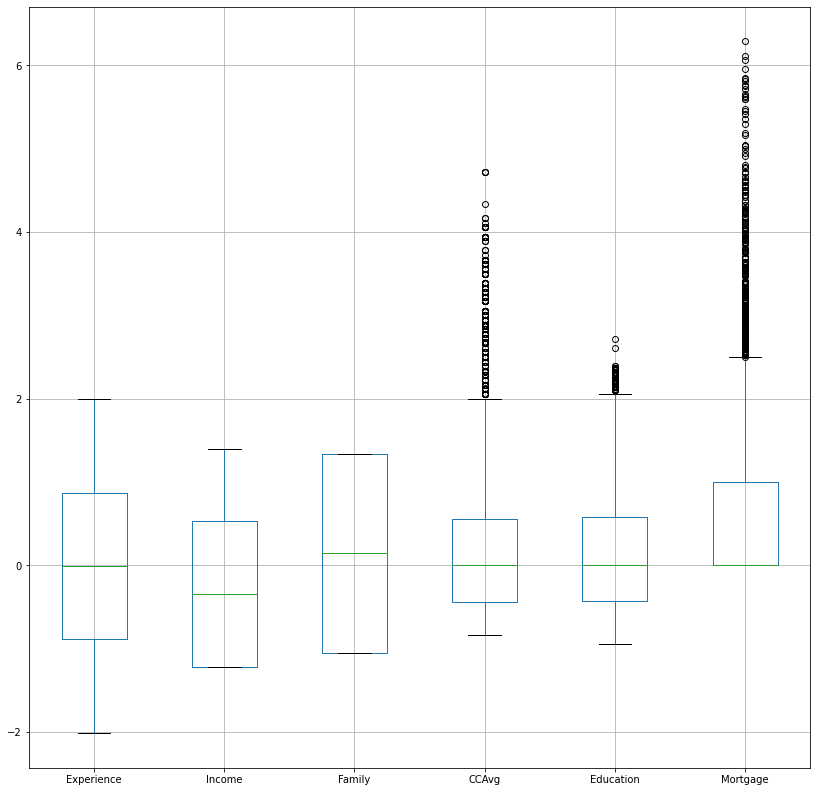

In [ ]:
df_X_em_stand.boxplot(figsize=(14,14))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe54d4a5950>,
      dtype=object)

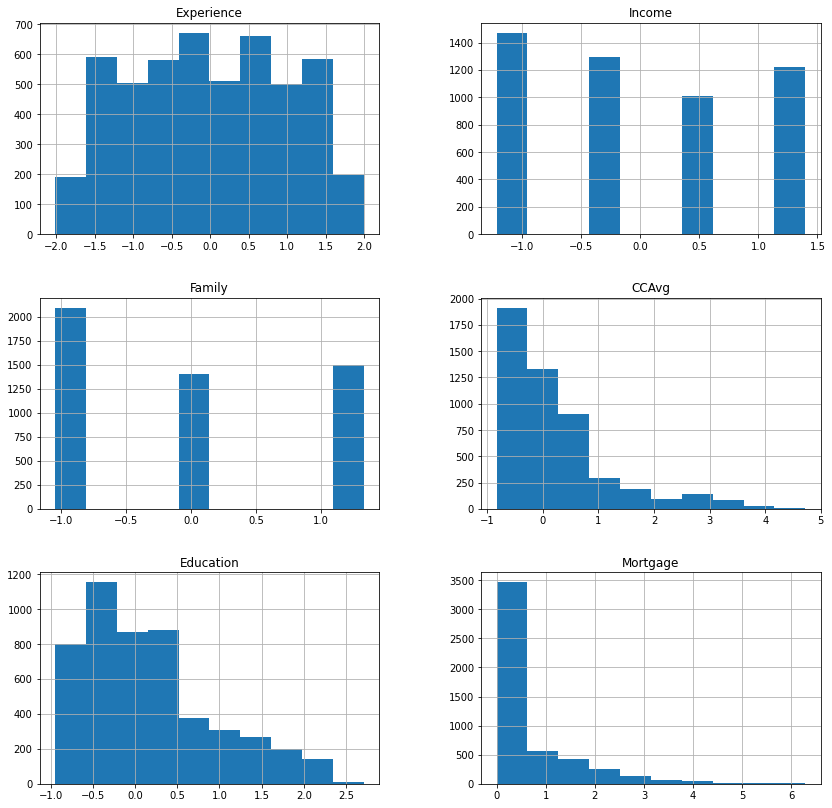

In [ ]:
df_X_em_stand.hist(figsize=(14,14))

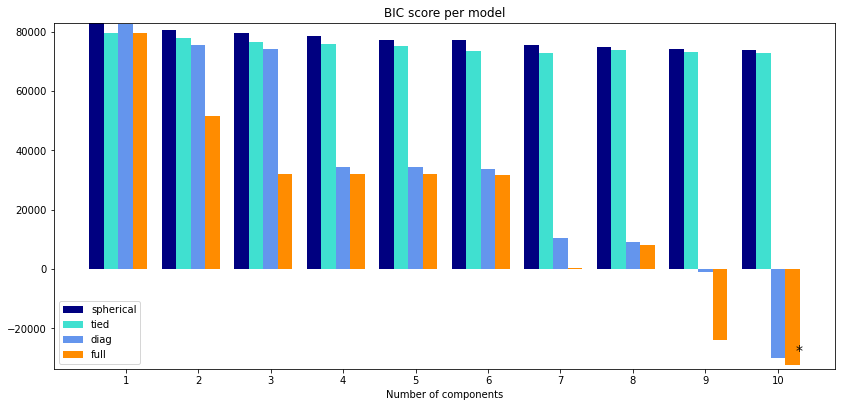

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, mixture
import itertools

# Fit the data using a Gaussian mixture model and calculate the BIC for
# different numbers of clusters, ranging for 1 to 10
lowest_bic = np.infty
bic = []
n_components_range = range(1, 11)
cv_types = ["spherical", "tied", "diag", "full"]
for cv_type in cv_types:
    for n_components in n_components_range:
        # Fit a Gaussian mixture with EM
        gmm = mixture.GaussianMixture(
            n_components=n_components, covariance_type=cv_type, random_state=0
        )
        gmm.fit(df_X_em_stand)
        bic.append(gmm.bic(df_X_em_stand))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

bic = np.array(bic)
color_iter = itertools.cycle(["navy", "turquoise", "cornflowerblue", "darkorange"])
clf = best_gmm
bars = []

# Plot the BIC scores
plt.figure(figsize=(14, 14))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + 0.2 * (i - 2)
    bars.append(
        plt.bar(
            xpos,
            bic[i * len(n_components_range) : (i + 1) * len(n_components_range)],
            width=0.2,
            color=color,
        )
    )
plt.xticks(n_components_range)
plt.ylim([bic.min() * 1.01 - 0.01 * bic.max(), bic.max()])
plt.title("BIC score per model")
xpos = (
    np.mod(bic.argmin(), len(n_components_range))
    + 0.65
    + 0.2 * np.floor(bic.argmin() / len(n_components_range))
)
plt.text(xpos, bic.min() * 0.97 + 0.03 * bic.max(), "*", fontsize=14)
spl.set_xlabel("Number of components")
spl.legend([b[0] for b in bars], cv_types)

In [ ]:
# Choosing K=10 and covariance of "FULL" based on BIC score

gmm_optimal = mixture.GaussianMixture(n_components= 10, covariance_type="diag", random_state= 0)
gmm_optimal.fit(df_X_em_stand)
cluster_labels_em = gmm_optimal.predict(df_X_em_stand)

In [ ]:
df_X_em_viz = X_em.copy()
df_X_em_viz['Cluster Labels'] = cluster_labels_em
df_X_em_viz.head(100)

,Experience,Income,Family,CCAvg,Education,Mortgage,Cluster Labels
0,1,49,4,1.6,1,0,6
1,19,34,3,1.5,1,0,5
2,15,11,1,1.0,1,0,5
3,9,100,1,2.7,2,0,8
4,8,45,4,1.0,2,0,6
...,...,...,...,...,...,...,...
95,12,48,4,0.2,3,0,6
96,15,80,1,5.2,1,0,5
97,28,161,1,2.9,1,0,5
98,23,94,1,0.3,1,0,5


In [ ]:
# Intrepratation of each cluster, by taking means for continous variables and mode for categorical variables
df_X_em_viz['Total'] = df_X_em_viz['Cluster Labels']
df_X_em_viz.groupby('Cluster Labels').agg(
  {
    'Experience': 'mean',
    'Family': lambda x: x.value_counts().index[0],
    'Education': lambda x: x.value_counts().index[0],
    'Income': 'mean',
    'CCAvg': 'mean',
    'Mortgage': 'mean',
    'Total': 'count'
  }
).reset_index()

,Cluster Labels,Experience,Family,Education,Income,CCAvg,Mortgage,Total
0,0,21.457971,1,3,64.144928,1.710435,161.423188,345
1,1,21.602549,1,3,68.280417,1.754983,0.000000,863
2,2,21.500000,2,2,174.266667,6.108333,462.233333,30
3,3,20.364341,4,2,59.209302,1.389664,159.434109,129
4,4,19.591049,2,1,83.967593,2.155478,199.337963,648
5,5,20.627273,1,1,94.185950,2.520124,0.000000,1210
6,6,18.126984,4,2,47.380952,1.222063,0.000000,630
7,7,14.507812,4,3,74.523438,1.740885,148.687500,128
8,8,20.040761,3,2,69.012228,1.867120,0.000000,736
9,9,19.658363,3,2,58.330961,1.456821,157.174377,281


In [ ]:
df_X_em_visual = df_X_em_stand.copy()
df_X_em_visual['Cluster Labels'] = cluster_labels_em

In [ ]:
df_X_em_visual.head(10)

,Experience,Income,Family,CCAvg,Education,Mortgage,Cluster Labels
0,-1.666078,1.397414,-1.049078,0.055556,-0.254237,0.000000,6
1,-0.096330,0.525991,-1.049078,0.000000,-0.508475,0.000000,5
2,-0.445163,-1.216855,-1.049078,-0.277778,-0.898305,0.000000,5
3,-0.968413,-1.216855,0.141703,0.666667,0.610169,0.000000,8
4,-1.055621,1.397414,0.141703,-0.277778,-0.322034,0.000000,6
5,-0.619580,1.397414,0.141703,-0.611111,-0.593220,1.534653,3
6,0.601336,-0.345432,0.141703,0.000000,0.135593,0.000000,8
7,0.339711,-1.216855,1.332484,-0.666667,-0.711864,0.000000,1
8,-0.881204,0.525991,0.141703,-0.500000,0.288136,1.029703,9
9,-0.968413,-1.216855,1.332484,4.111111,1.966102,0.000000,1


sns.pairplot(df_X_em_visual, hue = 'Cluster Labels', palette= ['red', 'blue', 'black', 'green', 'yellow', 'brown', 'orange', 'purple'], markers=['o', 's', 'd', 'v', 'P', 'p', 'h', 'H'], corner = True)

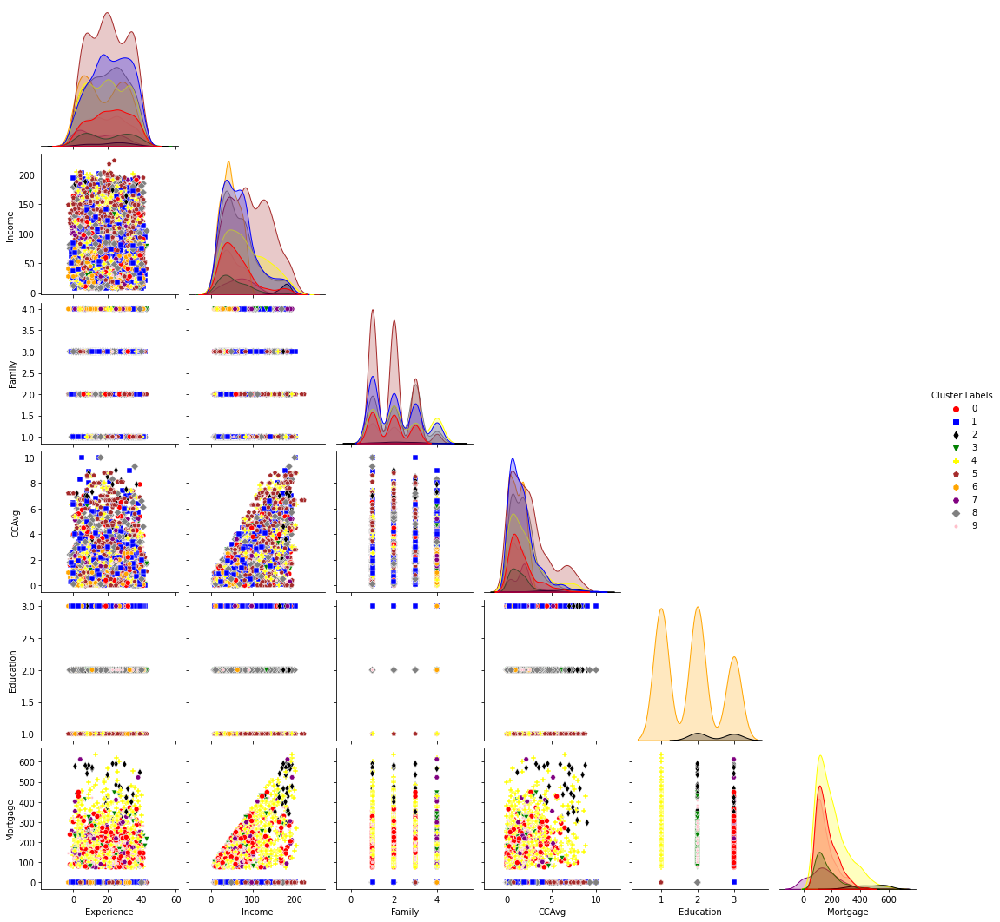

In [ ]:
sns.pairplot(df_X_em_viz.drop(['Total'], axis=1), hue = 'Cluster Labels', palette= ['red', 'blue', 'black', 'green', 'yellow', 'brown', 'orange', 'purple', 'gray', 'pink'], markers=['o', 's', 'd', 'v', 'P', 'p', 'h', 'H', 'D', '.'], corner = True)

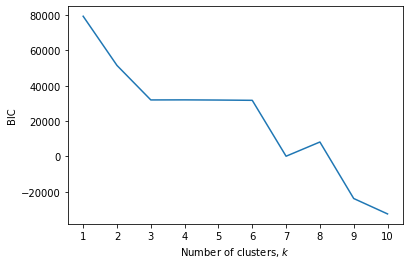

In [ ]:
# Fit the data using a Gaussian mixture model and calculate the BIC for
# different numbers of clusters, ranging for 1 to 10
ks = np.arange(1,11)
bics = []
for k in ks:
    gmm = mixture.GaussianMixture(n_components=k, covariance_type='full', random_state=0)
    gmm.fit(df_X_em_stand)
    bics.append(gmm.bic(df_X_em_stand))

# Plot the data
fig, ax = plt.subplots()
ax.plot(ks, bics)
ax.set_xlabel(r'Number of clusters, $k$')
ax.set_ylabel('BIC')
ax.set_xticks(ks);

In [ ]:
X_pca = df.drop(['Personal Loan', 'ID', 'ZIP Code', 'Age',
                 'Securities Account', 'CD Account', 'Online', 'CreditCard'], axis=1)
y = df['Personal Loan']

In [ ]:
from sklearn.model_selection import train_test_split

X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca, y, test_size= 0.25,
                                                    random_state=27, stratify = y)

In [ ]:
X_train_pca.shape

(3750, 6)

In [ ]:
normal_col = ['Experience','Education', 'Family',]
skewd_col = ['CCAvg', 'Income', 'Mortgage']

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.compose import ColumnTransformer

normal_pipeline = Pipeline(steps = [('scale', StandardScaler())])
skewd_pipline = Pipeline(steps = [('sk_scale', RobustScaler())])

full_preprocessor = ColumnTransformer(transformers=[
        ('normal_transform', normal_pipeline, normal_col),
        ('skewd_transform', skewd_pipline, skewd_col)], remainder ='passthrough')

X_pca_scaled = full_preprocessor.fit_transform(X_train_pca)

df_X_pca_scaled = pd.DataFrame(X_pca_scaled, columns= X_pca.columns)

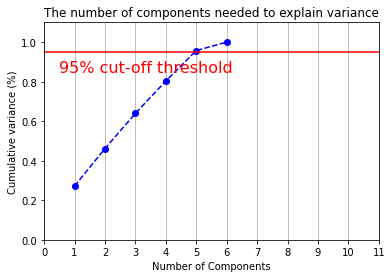

In [ ]:
from sklearn.decomposition import PCA

explained_variance = []

for components in range(1, df_X_pca_scaled.shape[1] +1):
  pca = PCA(n_components = components, random_state =0)
  pca.fit(df_X_pca_scaled)
  explained_variance.append(np.cumsum(pca.explained_variance_ratio_))

  fig, ax = plt.subplots()
  xi = np.arange(1, df_X_pca_scaled.shape[1]+1, step=1)
  y = np.cumsum(pca.explained_variance_ratio_)

  plt.ylim(0.0,1.1)
  plt.plot(xi, y, marker='o', linestyle='--', color='b')

  plt.xlabel('Number of Components')
  plt.xticks(np.arange(0, n_components+2, step=1)) #change from 0-based array index to 1-based human-readable label
  plt.ylabel('Cumulative variance (%)')
  plt.title('The number of components needed to explain variance')

  plt.axhline(y=0.95, color='r', linestyle='-')
  plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

  ax.grid(axis='x')
  plt.show()

In [ ]:
df_X_pca_scaled.shape[1]

7

In [ ]:
# Choosing 5 components out of 7 features to be able to explain 95% of variations in data

pca_optimal = PCA(n_components= 5, random_state= 0)
pca_optimal.fit(df_X_pca_scaled)
pca_reduced = pca_optimal.transform(df_X_pca_scaled)
pca_reduced_X_test = pca_optimal.transform(X_test_pca)

In [ ]:
df_pca_reduced = pd.DataFrame(pca_reduced, columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])

In [ ]:
pca_reduced_matrix = df_pca_reduced.to_numpy()

NN with PCA Dimension

In [ ]:
## NN Model For PCA
X_train_pca_s, X_val_pca_s, y_train_pca, y_val_pca = train_test_split(df_pca_reduced, y_train, test_size=0.15, stratify= y_train)

In [ ]:
print(y_train_pca.value_counts())
print(y_val_pca.value_counts())
print(y_test.value_counts())

0    2881
1     306
Name: Personal Loan, dtype: int64
0    509
1     54
Name: Personal Loan, dtype: int64
0    1130
1     120
Name: Personal Loan, dtype: int64


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe54ce42290>,
      dtype=object)

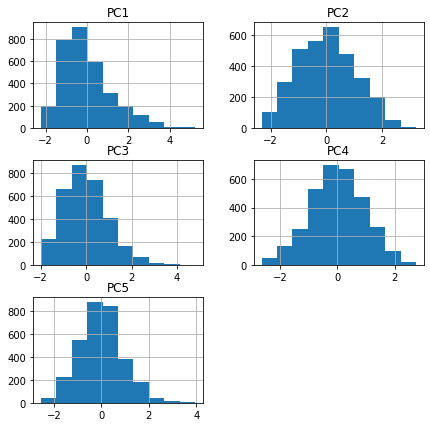

In [ ]:
X_train_pca_s.hist(figsize=(7,7))

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

nn_transformer = StandardScaler()
X_train_pca_scaled = nn_transformer.fit_transform(X_train_pca_s)
X_val_pca_scaled = nn_transformer.transform(X_val_pca_s)
X_test_pca_scaled = nn_transformer.transform(pca_reduced_X_test)


df_X_train_pca_scaled = pd.DataFrame(X_train_pca_scaled, columns= X_train_pca_s.columns)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  "X does not have valid feature names, but"


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe54c591490>,
      dtype=object)

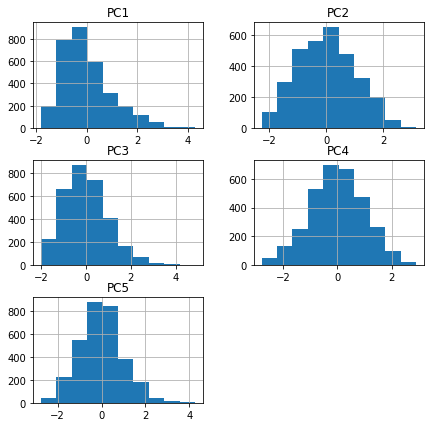

In [ ]:
df_X_train_pca_scaled.hist(figsize=(7,7))

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
import torchvision.transforms as transforms
from sklearn.metrics import precision_score, recall_score, classification_report, f1_score
from sklearn.utils import resample
import numpy as np

In [ ]:
def check_accuracy(loader, model):
  num_correct = 0
  num_samples = 0
  precision_list = []
  recall_list = []
  f1_score_list = []
  model.eval()

  with torch.no_grad():
    for x, y_true in loader:
      x = x.to(device = device)
      y = y_true.to(device = device)

      scores = model.forward(x.float())
      _, y_pred = scores.max(1)
      y_pred = y_pred.to(y_true.device)

      # tp = (y_true * y_pred).sum()
      # tn = ((1 - y_true) * (1 - y_pred)).sum()
      # fp = ((1 - y_true) * y_pred).sum()
      # fn = (y_true * (1 - y_pred)).sum()

      # epsilon = 1e-7

      precision = precision_score(y_true, y_pred, average='macro', zero_division=1)
      precision_list.append(precision.tolist())
      recall = recall_score(y_pred, y_true, average='macro', zero_division=1)
      recall_list.append(recall.tolist())
      f1 = f1_score(y_true, y_pred, average='macro', zero_division=1)
      f1_score_list.append(f1.tolist())

      num_correct += (y_pred == y_true).sum()
      num_samples += y_pred.size(0)

  return np.mean(f1_score_list)

In [ ]:
def check_classification_report(loader, model):
  num_correct = 0
  num_samples = 0
  precision_list = []
  recall_list = []
  f1_score_list = []
  model.eval()

  with torch.no_grad():
    for x, y_true in loader:
      x = x.to(device = device)
      y = y_true.to(device = device)

      scores = model.forward(x.float())
      _, y_pred = scores.max(1)
      y_pred = y_pred.to(y_true.device)

      # tp = (y_true * y_pred).sum()
      # tn = ((1 - y_true) * (1 - y_pred)).sum()
      # fp = ((1 - y_true) * y_pred).sum()
      # fn = (y_true * (1 - y_pred)).sum()

      # epsilon = 1e-7

      precision = precision_score(y_true, y_pred, average='macro', zero_division=1)
      precision_list.append(precision.tolist())
      recall = recall_score(y_pred, y_true, average='macro', zero_division=1)
      recall_list.append(recall.tolist())
      f1 = f1_score(y_true, y_pred, average='macro', zero_division=1)
      f1_score_list.append(f1.tolist())

      num_correct += (y_pred == y_true).sum()
      num_samples += y_pred.size(0)

  print(f'Got {num_correct} / {num_samples} with accuracy of {float(num_correct)/ float(num_samples)*100:.2f}')
  print(f'Average Precision Score: {np.mean(precision_list):.2f}')
  print(f'Average recall Score: {np.mean(recall_list):.2f}')
  print(f'Average f1-Score: {np.mean(f1_score_list):.2f}')

In [ ]:
class NN(nn.Module):
    def __init__(self, input_size, num_classes, hidden_layer):
      super(NN, self).__init__()
      self.fc1 = nn.Linear(input_size, hidden_layer)
      self.fc2 = nn.Linear(hidden_layer, num_classes)
      # self.fc3 = nn.Linear(15, num_classes)
      self.sig = nn.Sigmoid()
      self.leaky_relu = nn.LeakyReLU()

    def forward(self, x):
      x = self.fc1(x)
      x = self.sig(x)
      # x = self.leaky_relu(self.fc2(x))
      x = self.fc2(x)
      return x

In [ ]:
#set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [ ]:
#Hyperparameters
input_size = X_train_pca_scaled.shape[1]
num_classes = 2
hidden_layer = 16
learning_rate = 0.003
batch_size = 32
num_epochs = 45
regularization_rate = 0.003

In [ ]:
#Converting Dataframe to Tensors
X_train_tensor = torch.tensor(X_train_pca_scaled)
X_val_tensor = torch.tensor(X_val_pca_scaled)
X_test_tensor = torch.tensor(X_test_pca_scaled)
y_train_tensor = torch.tensor(y_train_pca.values)
y_val_tensor = torch.tensor(y_val_pca.values)
y_test_tensor = torch.tensor(y_test.values)

In [ ]:
train_data_pca = TensorDataset(X_train_tensor, y_train_tensor)
val_data_pca = TensorDataset(X_val_tensor, y_val_tensor)
test_data_pca = TensorDataset(X_test_tensor, y_test_tensor)

In [ ]:
#Loading Train and Test dataset
train_data_load = DataLoader(dataset = train_data_pca, batch_size = batch_size)
val_data_load = DataLoader(dataset = val_data_pca, batch_size= batch_size)
test_data_load = DataLoader(dataset = test_data_pca, batch_size = batch_size)

In [ ]:
#Initialize Network
model = NN(input_size = input_size, num_classes = num_classes, hidden_layer= hidden_layer).to(device)

In [ ]:
#Defining Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = learning_rate, weight_decay= regularization_rate)

In [ ]:
from time import time

training_time_nn_pca = []
epoch_c = []
val_score = []
train_score = []
epoch_loss = []
batch_loss = []
for epoch in range(num_epochs):
  t_0_nn_pca = time()
  for batch_idx, (data, targets) in enumerate(train_data_load):
    data = data.to(device=device)
    targets = targets.to(device=device)
    #Forward

    scores = model.forward(data.float())
    loss = criterion(scores, targets)
    batch_loss.append(loss.tolist())

    #backward
    optimizer.zero_grad()
    loss.backward()

    #Update Parameters
    optimizer.step()


    print(f'Batch # {batch_idx} Loss: {loss:.2f}')

  training_time_nn_pca.append(time() - t_0_nn_pca)
  epoch_loss.append(np.mean(batch_loss))
  epoch_c.append(epoch)
  train_score.append(check_accuracy(train_data_load, model))
  val_score.append(check_accuracy(val_data_load, model))
  print(f'---> Epoch # {epoch} loss: {epoch_loss[epoch]:.2f}')
  print(f'-----> Validation score @ {epoch}: {val_score[epoch]:.2f}')

Batch # 0 Loss: 0.68
Batch # 1 Loss: 0.64
Batch # 2 Loss: 0.64
Batch # 3 Loss: 0.59
Batch # 4 Loss: 0.56
Batch # 5 Loss: 0.55
Batch # 6 Loss: 0.56
Batch # 7 Loss: 0.51
Batch # 8 Loss: 0.52
Batch # 9 Loss: 0.48
Batch # 10 Loss: 0.42
Batch # 11 Loss: 0.49
Batch # 12 Loss: 0.44
Batch # 13 Loss: 0.49
Batch # 14 Loss: 0.39
Batch # 15 Loss: 0.36
Batch # 16 Loss: 0.33
Batch # 17 Loss: 0.35
Batch # 18 Loss: 0.41
Batch # 19 Loss: 0.42
Batch # 20 Loss: 0.35
Batch # 21 Loss: 0.36
Batch # 22 Loss: 0.41
Batch # 23 Loss: 0.39
Batch # 24 Loss: 0.39
Batch # 25 Loss: 0.24
Batch # 26 Loss: 0.44
Batch # 27 Loss: 0.38
Batch # 28 Loss: 0.26
Batch # 29 Loss: 0.43
Batch # 30 Loss: 0.40
Batch # 31 Loss: 0.31
Batch # 32 Loss: 0.24
Batch # 33 Loss: 0.31
Batch # 34 Loss: 0.23
Batch # 35 Loss: 0.26
Batch # 36 Loss: 0.27
Batch # 37 Loss: 0.35
Batch # 38 Loss: 0.32
Batch # 39 Loss: 0.43
Batch # 40 Loss: 0.34
Batch # 41 Loss: 0.20
Batch # 42 Loss: 0.45
Batch # 43 Loss: 0.35
Batch # 44 Loss: 0.24
Batch # 45 Loss: 0.3

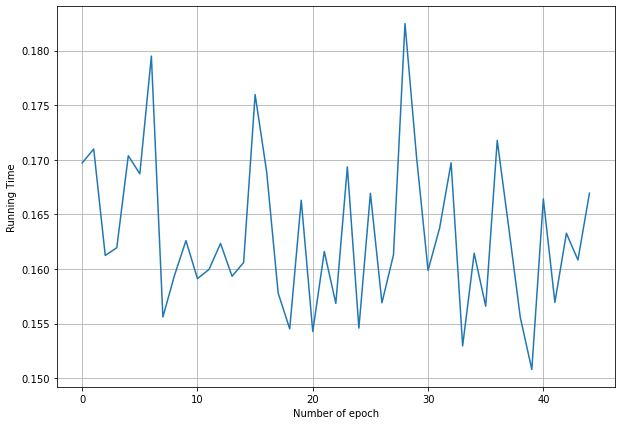

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(10,7))
plt.grid()
plt.plot(range(45), training_time_nn_pca)
plt.xlabel("Number of epoch")
plt.ylabel("Running Time")
plt.show()

In [ ]:
import matplotlib.pyplot as plt

def plot_learning_curve_mlp(epoch, train_score, val_score, x_label, y_label, title):
  plt.grid()
  plt.plot(epoch, train_score, 'r', label= 'Training Score')
  plt.plot(epoch, val_score, 'b', label = 'Validation Score')
  plt.ylabel(y_label)
  plt.xlabel(x_label)
  plt.title(title)
  plt.legend(loc='best')

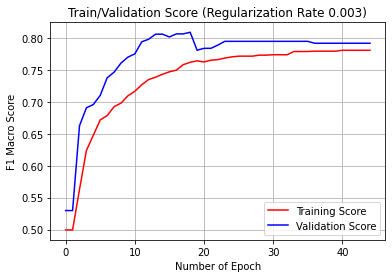

In [ ]:
plot_learning_curve_mlp(epoch_c, train_score, val_score, 'Number of Epoch', 'F1 Macro Score', 'Train/Validation Score (Regularization Rate {})'.format(regularization_rate))

In [ ]:
check_classification_report(test_data_load, model)

Got 1003 / 1250 with accuracy of 80.24
Average Precision Score: 0.48
Average recall Score: 0.48
Average f1-Score: 0.46


In [ ]:
check_classification_report(train_data_load, model)

Got 3023 / 3187 with accuracy of 94.85
Average Precision Score: 0.94
Average recall Score: 0.94
Average f1-Score: 0.78


For 2 number of clusters, the average Silhouette score is 0.24577071322476315
For 3 number of clusters, the average Silhouette score is 0.19211139816871695
For 4 number of clusters, the average Silhouette score is 0.21167086159625936
For 5 number of clusters, the average Silhouette score is 0.20977627201847668
For 6 number of clusters, the average Silhouette score is 0.22042806311954563
For 7 number of clusters, the average Silhouette score is 0.2150317894663941
For 8 number of clusters, the average Silhouette score is 0.22315761507418452
For 9 number of clusters, the average Silhouette score is 0.21810766968608286
For 10 number of clusters, the average Silhouette score is 0.21386289695201066
For 11 number of clusters, the average Silhouette score is 0.2082155960182556
For 12 number of clusters, the average Silhouette score is 0.2119117020415092
For 13 number of clusters, the average Silhouette score is 0.21722965204065106
For 14 number of clusters, the average Silhouette score is 0.21

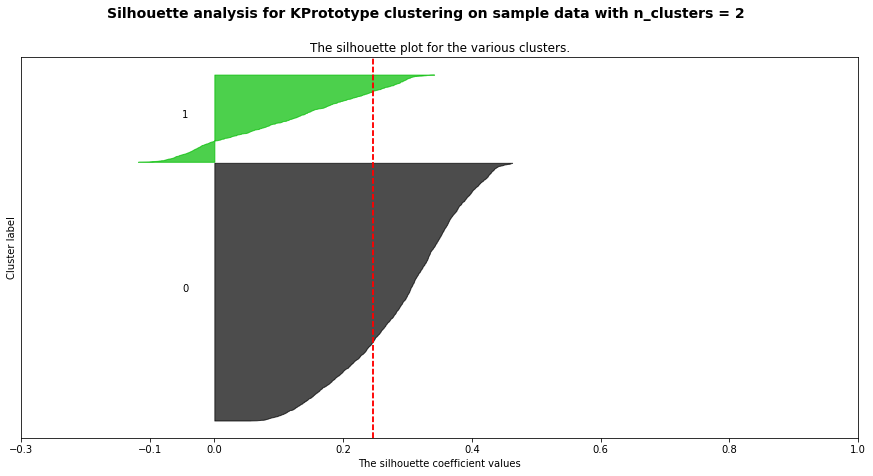

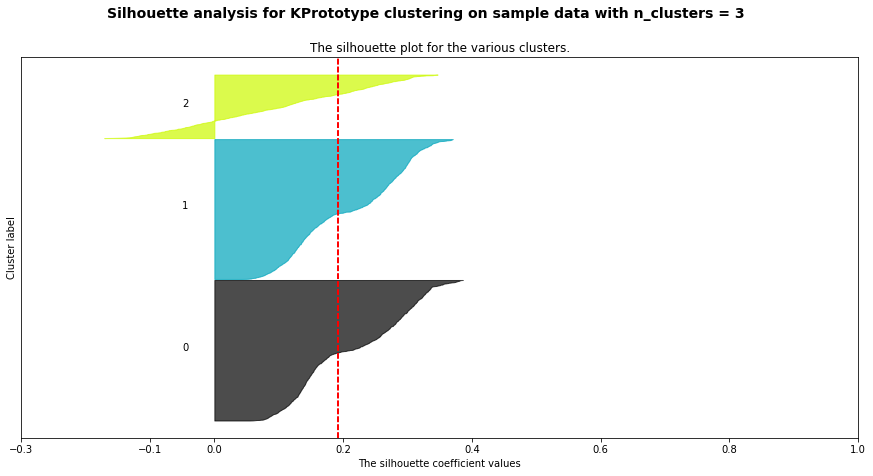

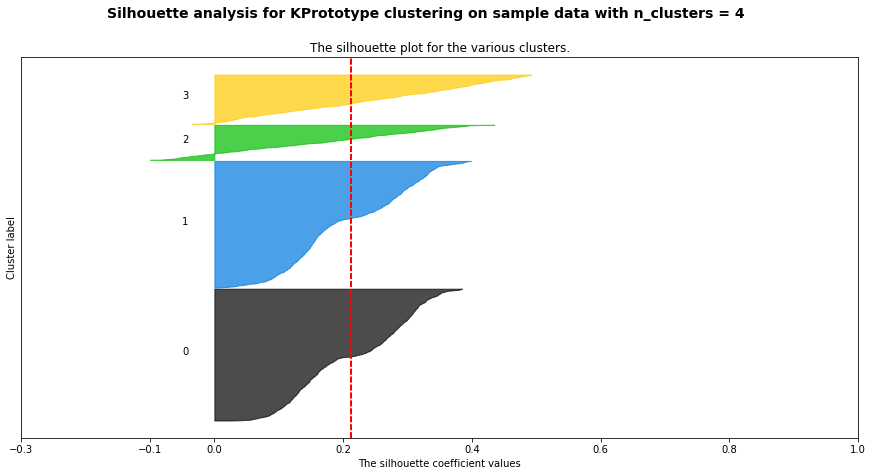

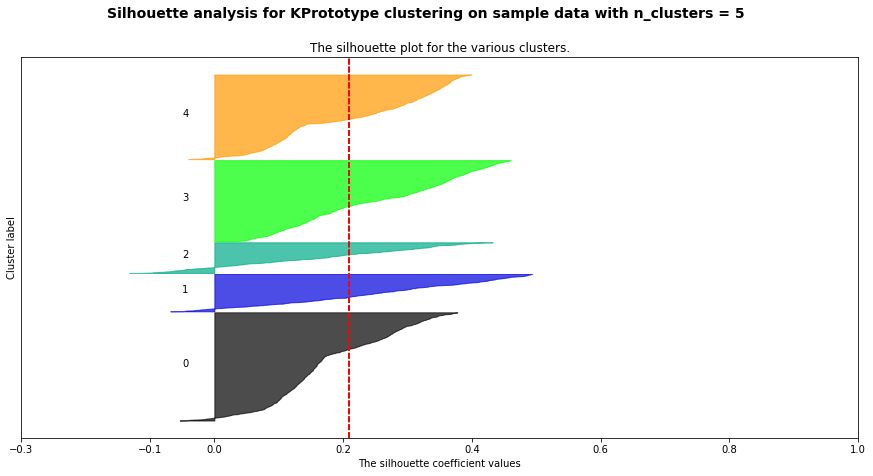

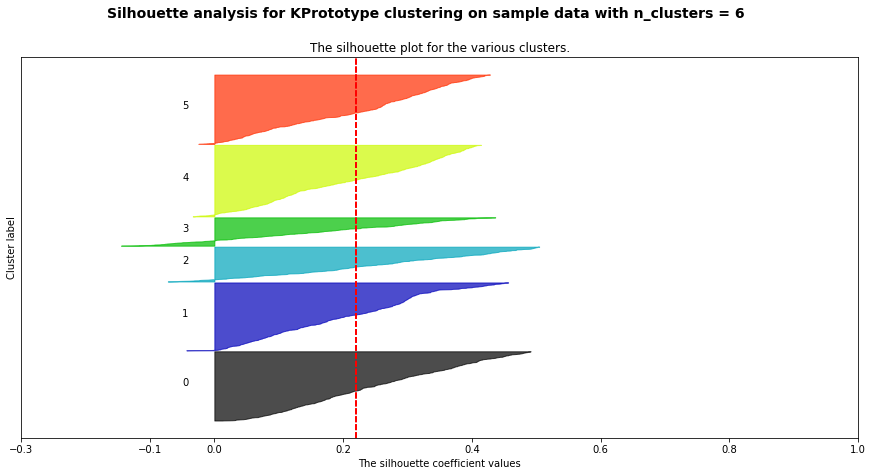

...

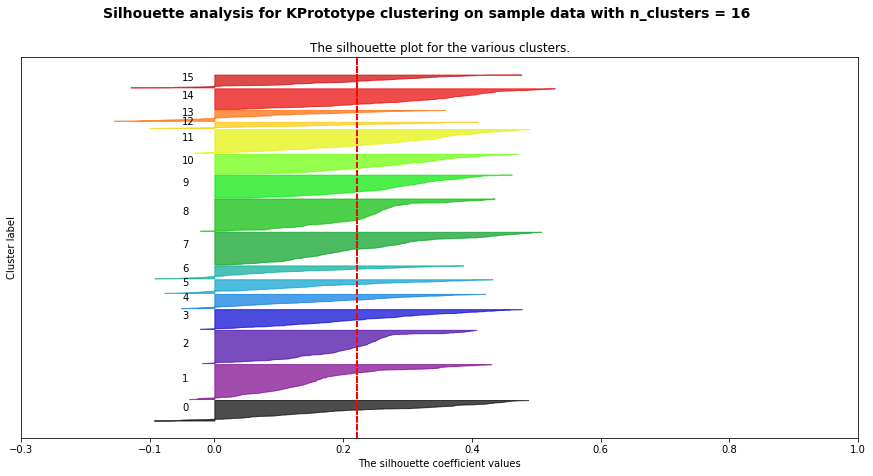

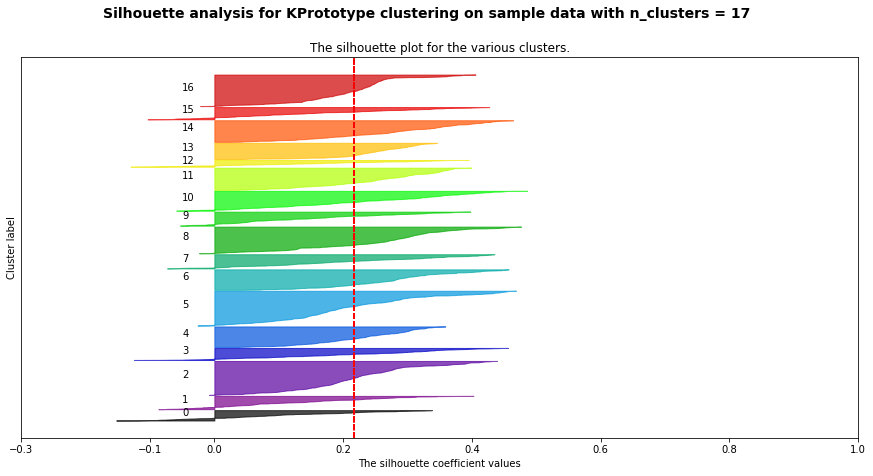

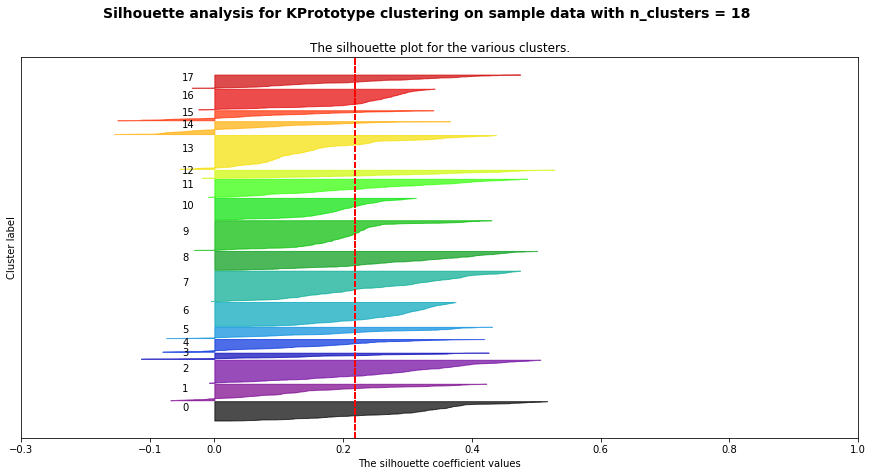

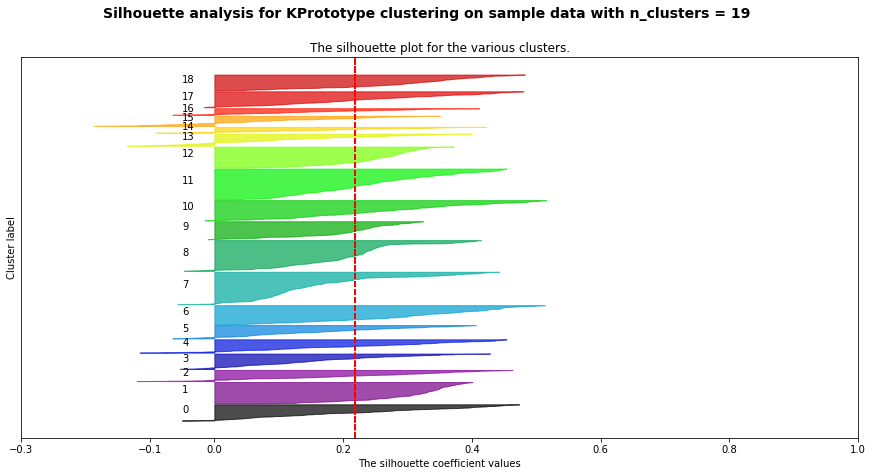

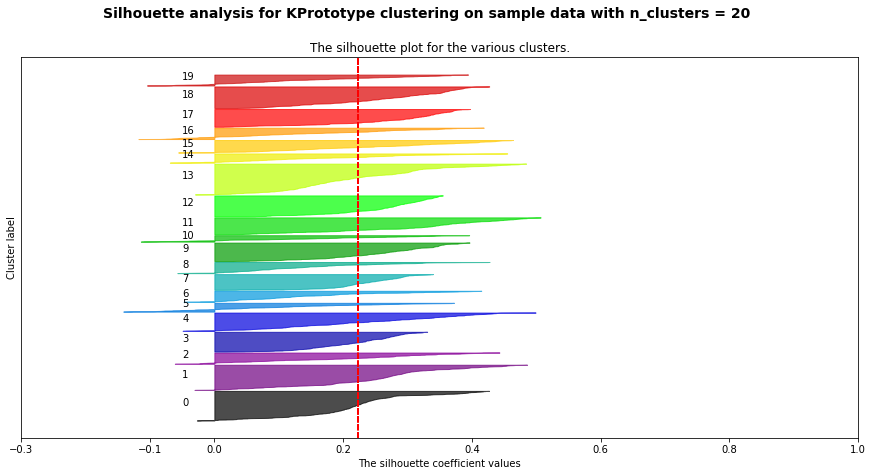

In [ ]:
from sklearn.cluster import KMeans

elbow_lost_pca = []
silhouette_avg_list_pca = []

for cluster in range(2, 21):

    fig, ax1 = plt.subplots()
    fig.set_size_inches(15, 7)

    kmeans = KMeans(n_clusters= cluster, random_state= 0)
    cluster_labels_pca = kmeans.fit_predict(pca_reduced_matrix)
    #The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    #clusters

    silhouette_avg_pca = silhouette_score(pca_reduced_matrix, cluster_labels_pca)
    silhouette_avg_list_pca.append(silhouette_avg_pca)
    elbow_lost_pca.append(kmeans.inertia_)
    print(f'For {cluster} number of clusters, the average Silhouette score is {silhouette_avg_pca}')

    # Compute the silhouette scores for each sample
    sample_silhouette_values_pca = silhouette_samples(df_pca_reduced, cluster_labels_pca)

    y_lower = 10
    for i in range(cluster):
      # Aggregate the silhouette scores for samples belonging to
      # cluster i, and sort them
      ith_cluster_silhouette_values_pca = \
            sample_silhouette_values_pca[cluster_labels_pca == i]

      ith_cluster_silhouette_values_pca.sort()

      size_cluster_i = ith_cluster_silhouette_values_pca.shape[0]
      y_upper = y_lower + size_cluster_i

      color = cm.nipy_spectral(float(i) / cluster)
      ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values_pca,
                          facecolor=color, edgecolor=color, alpha=0.7)

      # Label the silhouette plots with their cluster numbers at the middle
      ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

      # Compute the new y_lower for next plot
      y_lower = y_upper + 10  # 10 for the 0 samples

      ax1.set_title("The silhouette plot for the various clusters.")
      ax1.set_xlabel("The silhouette coefficient values")
      ax1.set_ylabel("Cluster label")

      # The vertical line for average silhouette score of all the values
      ax1.axvline(x=silhouette_avg_pca, color="red", linestyle="--")

      ax1.set_yticks([])  # Clear the yaxis labels / ticks
      ax1.set_xticks([-0.3, -0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
      plt.suptitle(("Silhouette analysis for KPrototype clustering on sample data "
                  "with n_clusters = %d" % cluster),
                  fontsize=14, fontweight='bold')
      plt.subplots_adjust(hspace=0.4)


plt.show()

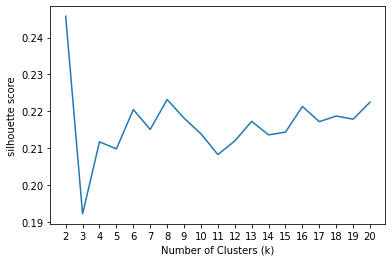

In [ ]:
plt.plot(range(2,21), silhouette_avg_list_pca)
plt.xlabel("Number of Clusters (k)")
plt.xticks(range(2,21))
plt.ylabel("silhouette score")
plt.show()

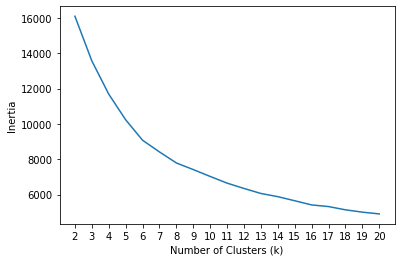

In [ ]:
plt.plot(range(2,21), elbow_lost_pca)
plt.xlabel("Number of Clusters (k)")
plt.xticks(range(2,21))
plt.ylabel("Inertia")
plt.show()

In [ ]:
kmeans_optimal = KMeans(n_clusters= 4, random_state= 0)
kmeans_optimal.fit(df_pca_reduced)
cluster_labels_pca_optimal = kmeans_optimal.predict(df_pca_reduced)

In [ ]:
cluster_labels_pca_optimal.shape

(3750,)

In [ ]:
df_pca_reduced_viz = df_pca_reduced.copy()
df_pca_reduced_viz['Cluster Labels'] = cluster_labels_pca_optimal

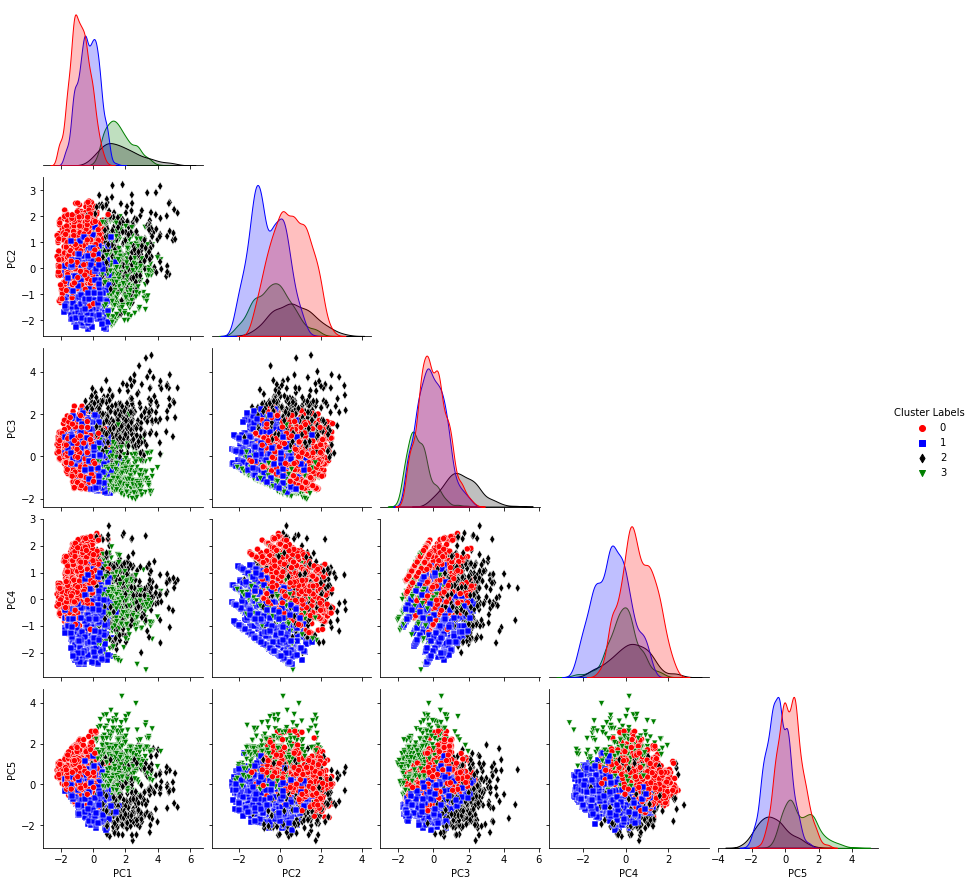

In [ ]:
sns.pairplot(df_pca_reduced_viz, hue = 'Cluster Labels', palette= ['r', 'blue', 'black', 'g'], markers=['o', 's', 'd', 'v'], corner = True)

In [ ]:
df_pca_reduced_viz_org = X_train_pca.copy()
df_pca_reduced_viz_org['Cluster Labels'] = cluster_labels_pca_optimal

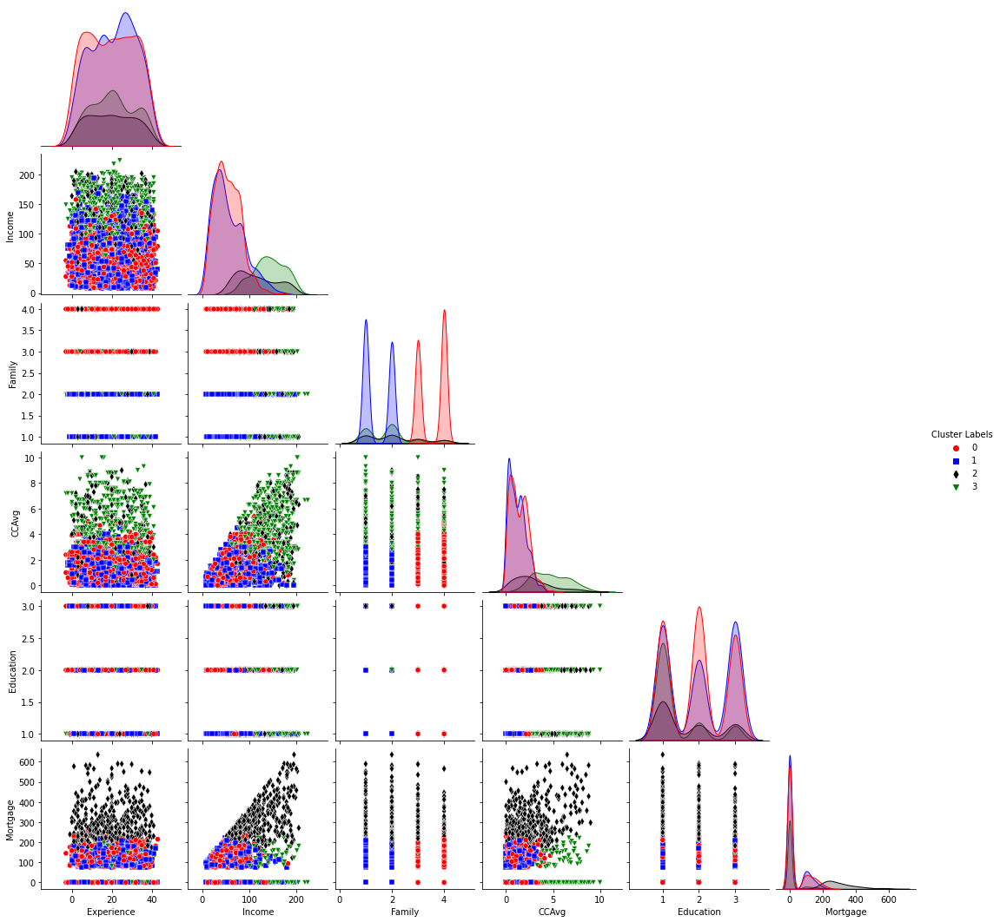

In [ ]:
sns.pairplot(df_pca_reduced_viz_org, hue = 'Cluster Labels', palette= ['r', 'blue', 'black', 'g'], markers=['o', 's', 'd', 'v'], corner = True)

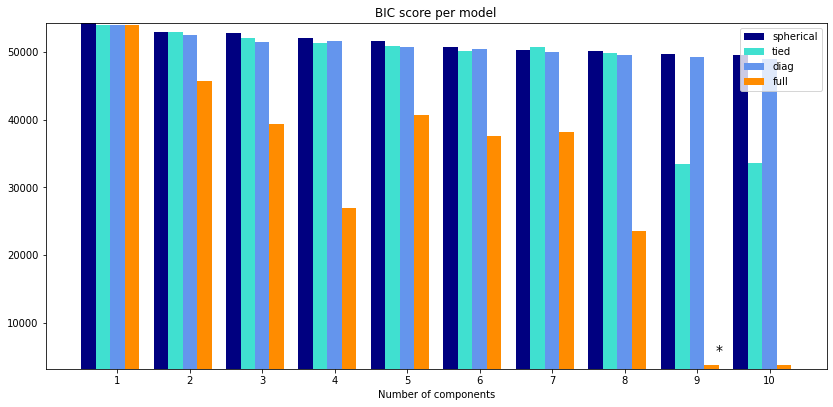

In [ ]:
# Fit the data using a Gaussian mixture model and calculate the BIC for
# different numbers of clusters, ranging for 1 to 10
lowest_bic_pca = np.infty
bic_pca = []
n_components_range_pca = range(1, 11)
cv_types = ["spherical", "tied", "diag", "full"]
for cv_type in cv_types:
    for n_components in n_components_range_pca:
        # Fit a Gaussian mixture with EM
        gmm_pca = mixture.GaussianMixture(
            n_components=n_components, covariance_type=cv_type, random_state=0
        )
        gmm_pca.fit(df_pca_reduced)
        bic_pca.append(gmm_pca.bic(df_pca_reduced))
        if bic_pca[-1] < lowest_bic_pca:
            lowest_bic_pca = bic_pca[-1]
            best_gmm_pca = gmm_pca

bic_pca = np.array(bic_pca)
color_iter = itertools.cycle(["navy", "turquoise", "cornflowerblue", "darkorange"])
clf_pca = best_gmm_pca
bars_pca = []

# Plot the BIC scores
plt.figure(figsize=(14, 14))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range_pca) + 0.2 * (i - 2)
    bars_pca.append(
        plt.bar(
            xpos,
            bic_pca[i * len(n_components_range_pca) : (i + 1) * len(n_components_range_pca)],
            width=0.2,
            color=color,
        )
    )
plt.xticks(n_components_range_pca)
plt.ylim([bic_pca.min() * 1.01 - 0.01 * bic_pca.max(), bic_pca.max()])
plt.title("BIC score per model")
xpos = (
    np.mod(bic_pca.argmin(), len(n_components_range_pca))
    + 0.65
    + 0.2 * np.floor(bic_pca.argmin() / len(n_components_range_pca))
)
plt.text(xpos, bic_pca.min() * 0.97 + 0.03 * bic_pca.max(), "*", fontsize=14)
spl.set_xlabel("Number of components")
spl.legend([b[0] for b in bars_pca], cv_types)

In [ ]:
# Choosing K=9 and covariance of "Full" based on BIC score

gmm_optimal_pca = mixture.GaussianMixture(n_components= 9, covariance_type="full", random_state= 0)
gmm_optimal_pca.fit(df_pca_reduced)
cluster_labels_pca_optimal_gmm = gmm_optimal_pca.predict(df_pca_reduced)

In [ ]:
df_pca_reduced_gmm_viz = df_pca_reduced.copy()
df_pca_reduced_gmm_viz['Cluster Labels'] = cluster_labels_pca_optimal_gmm

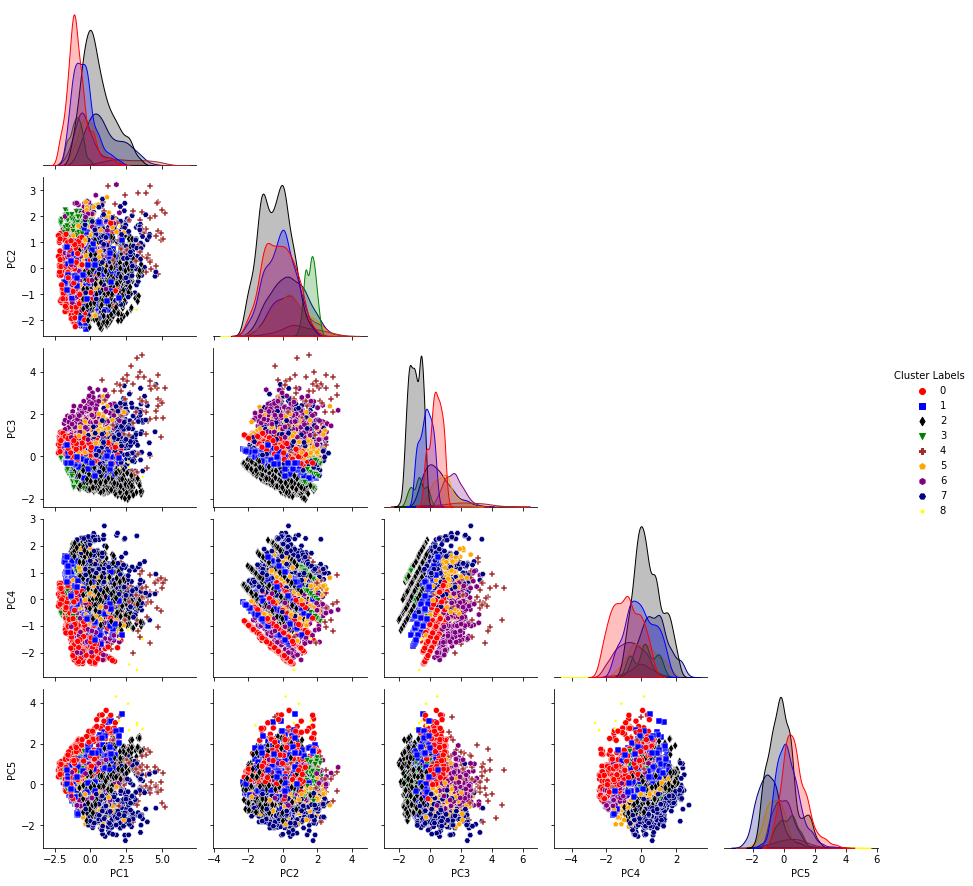

In [ ]:
sns.pairplot(df_pca_reduced_gmm_viz, hue = 'Cluster Labels', palette= ['red', 'blue', 'black', 'green', 'brown', 'orange', 'purple', 'navy', 'yellow'], markers=['o', 's', 'd', 'v', 'P', 'p', 'h', 'H', '.'], corner = True)

In [ ]:
df_pca_reduced_gmm_viz_org = X_train_pca.copy()
df_pca_reduced_gmm_viz_org['Cluster Labels'] = cluster_labels_pca_optimal_gmm

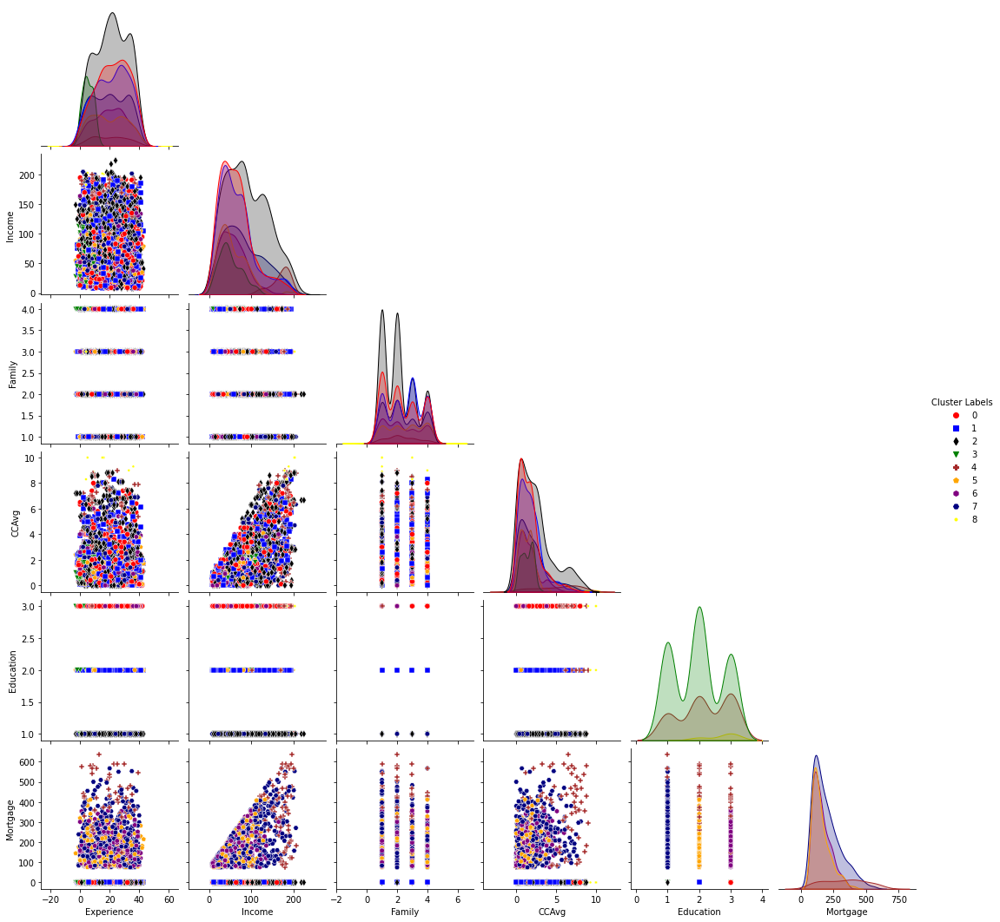

In [ ]:
sns.pairplot(df_pca_reduced_gmm_viz_org, hue = 'Cluster Labels', palette= ['red', 'blue', 'black', 'green', 'brown', 'orange', 'purple', 'navy', 'yellow'], markers=['o', 's', 'd', 'v', 'P', 'p', 'h', 'H', '.'], corner = True)

In [ ]:
X_ica = df.drop(['Personal Loan', 'ID', 'ZIP Code','Age', 'Securities Account', 'CD Account', 'Online', 'CreditCard'], axis=1)

In [ ]:
normal_col = ['Experience','Education', 'Family',]
skewd_col = ['CCAvg', 'Income', 'Mortgage']

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.compose import ColumnTransformer

normal_pipeline = Pipeline(steps = [('scale', StandardScaler())])
skewd_pipline = Pipeline(steps = [('sk_scale', RobustScaler())])

full_preprocessor = ColumnTransformer(transformers=[
        ('normal_transform', normal_pipeline, normal_col),
        ('skewd_transform', skewd_pipline, skewd_col)], remainder ='passthrough')

X_ica_scaled = full_preprocessor.fit_transform(X_ica)

df_X_ica_scaled = pd.DataFrame(X_ica_scaled, columns= X_ica.columns)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fe5473bd990>,
      dtype=object)

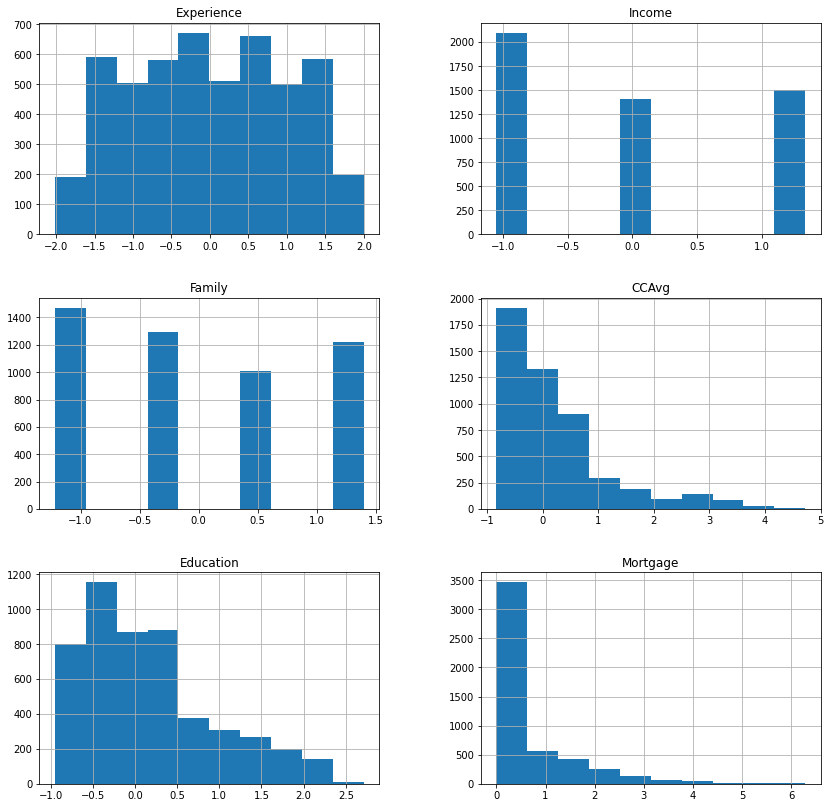

In [ ]:
df_X_ica_scaled.hist(figsize=(14,14))

In [ ]:
df_X_ica_scaled.head()

,Experience,Income,Family,CCAvg,Education,Mortgage
0,-1.666078,-1.049078,1.397414,0.055556,-0.254237,0.0
1,-0.096330,-1.049078,0.525991,0.000000,-0.508475,0.0
2,-0.445163,-1.049078,-1.216855,-0.277778,-0.898305,0.0
3,-0.968413,0.141703,-1.216855,0.666667,0.610169,0.0
4,-1.055621,0.141703,1.397414,-0.277778,-0.322034,0.0


In [ ]:
#Calculating Mutual Information between components
from sklearn.feature_selection import mutual_info_regression

def custom_mi_reg(a, b):
    a = a.reshape(-1, 1)
    return  mutual_info_regression(a, b, random_state=0)[0] # should return a float value

In [ ]:
ica_col = [str(i) for i in range(1, df_X_ica_scaled.shape[1] + 1)]

In [ ]:
from sklearn.decomposition import FastICA

kurtosis_list = []
mi_list = [1]
for i in range(1, df_X_ica_scaled.shape[1] + 1):
  ica = FastICA(n_components= i, random_state= 0)
  ica.fit(df_X_ica_scaled)
  X_ica_transformed = ica.transform(df_X_ica_scaled)

  df_X_ica_transformed = pd.DataFrame(X_ica_transformed, columns = ica_col[:i])
  #Storing Kurtosis and Mutual information
  if i >= 2:
    df_mi = df_X_ica_transformed.corr(method=custom_mi_reg)
    mu_matrix = df_mi.to_numpy()
    sum_mu = np.tril(mu_matrix).sum() - np.trace(mu_matrix)
    mi_list.append(sum_mu)


  kur_tranformed = abs(df_X_ica_transformed.kurtosis(axis=0)).mean()
  kurtosis_list.append(kur_tranformed)


Text(0, 0.5, 'Sum of Mutual Information between the components')

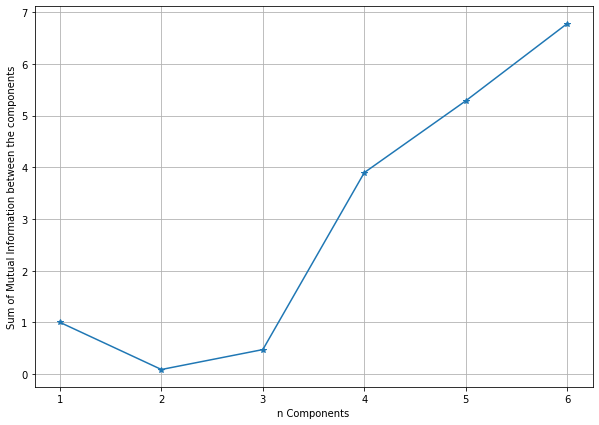

In [ ]:
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt

figure(figsize=(10,7))
plt.grid()
plt.plot(range(1, df_X_ica_scaled.shape[1] + 1), mi_list, marker='*')
plt.xlabel('n Components')
plt.ylabel('Sum of Mutual Information between the components')d

Text(0, 0.5, 'Mean of Kurtosis')

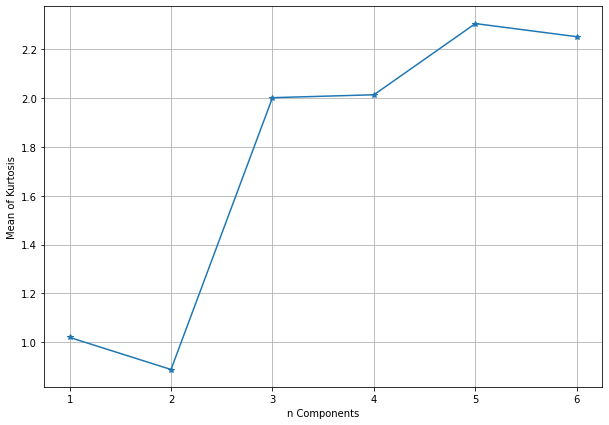

In [ ]:
from IPython.core.pylabtools import figsize
import matplotlib.pyplot as plt

figure(figsize=(10,7))
plt.grid()
plt.plot(range(1, df_X_ica_scaled.shape[1] + 1), kurtosis_list, marker='*')
plt.xlabel('n Components')
plt.ylabel('Mean of Kurtosis')

In [ ]:
# n=2 has the minimum Kurtosis value

ica_optimal = FastICA(n_components=2, random_state=0,max_iter = 20000)
ica_X_optimal = ica_optimal.fit_transform(df_X_ica_scaled)

In [ ]:
df_ica_X_optimal = pd.DataFrame(ica_X_optimal, columns=['IC1', 'IC2'])

In [ ]:
df_ica_X_optimal.corr()

,IC1,IC2
IC1,1.000000e+00,8.762115e-16
IC2,8.762115e-16,1.000000e+00


For 2 number of clusters, the average Silhouette score is 0.3312331273122168
For 3 number of clusters, the average Silhouette score is 0.3949134447996628
For 4 number of clusters, the average Silhouette score is 0.34296034683937043
For 5 number of clusters, the average Silhouette score is 0.3532740255758371
For 6 number of clusters, the average Silhouette score is 0.3642796977692192
For 7 number of clusters, the average Silhouette score is 0.35891825121017973
For 8 number of clusters, the average Silhouette score is 0.3450493548008226
For 9 number of clusters, the average Silhouette score is 0.3378643507013018
For 10 number of clusters, the average Silhouette score is 0.33329066524666257
For 11 number of clusters, the average Silhouette score is 0.34486072099943965
For 12 number of clusters, the average Silhouette score is 0.334424508221978
For 13 number of clusters, the average Silhouette score is 0.33360311720926544
For 14 number of clusters, the average Silhouette score is 0.3355135

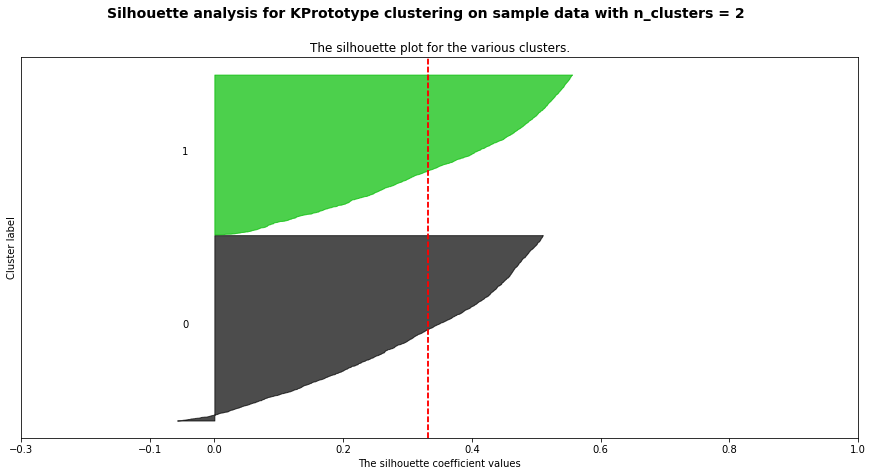

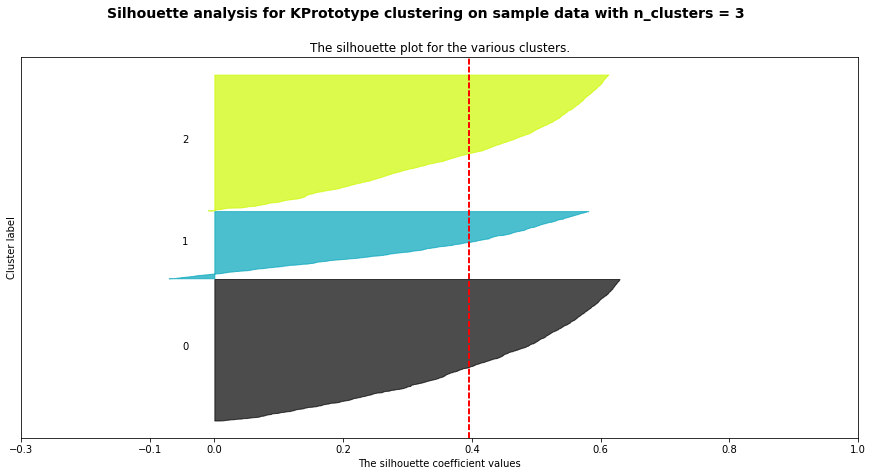

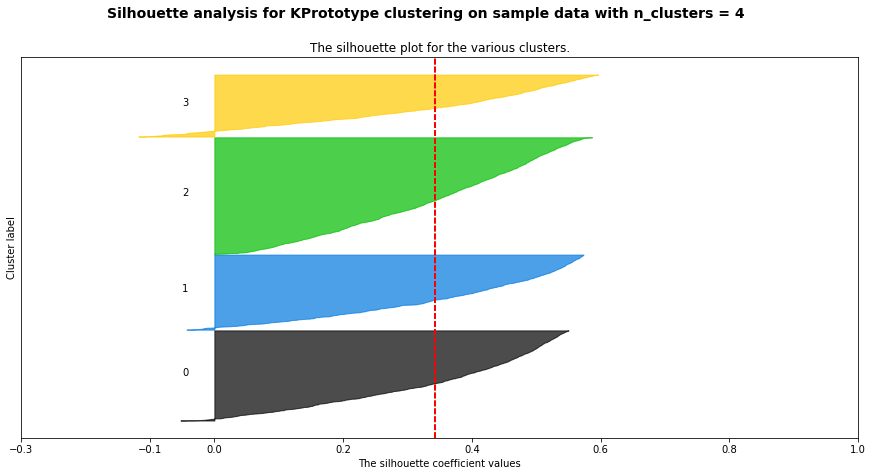

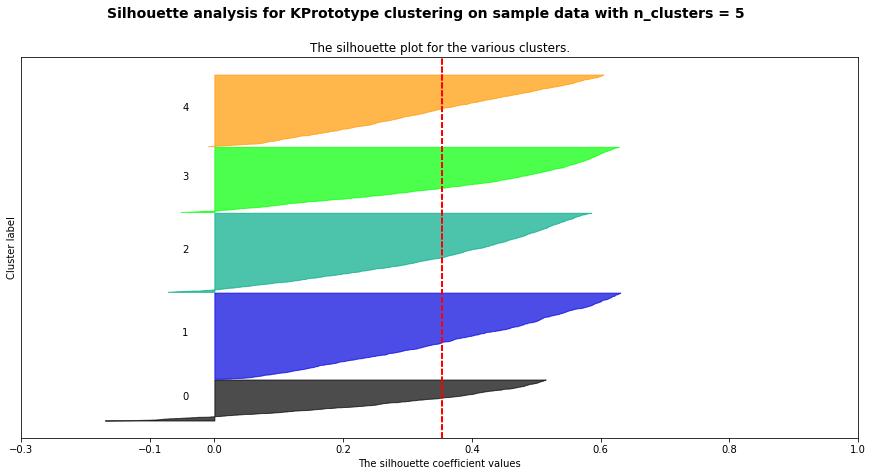

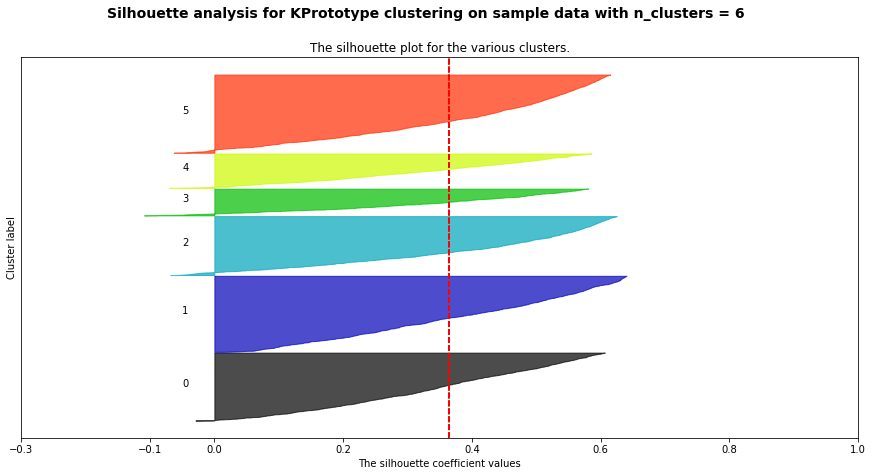

...

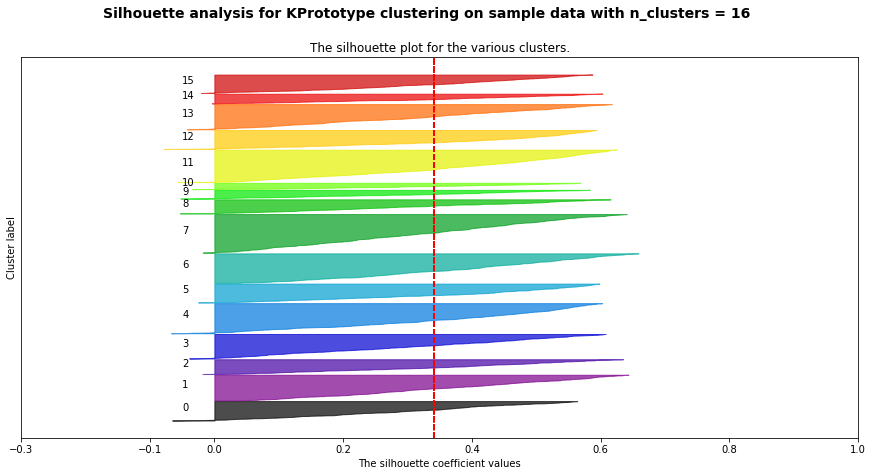

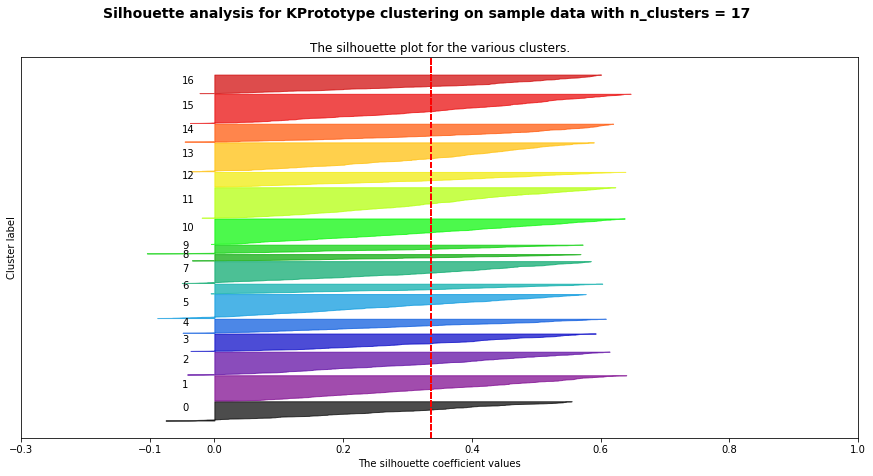

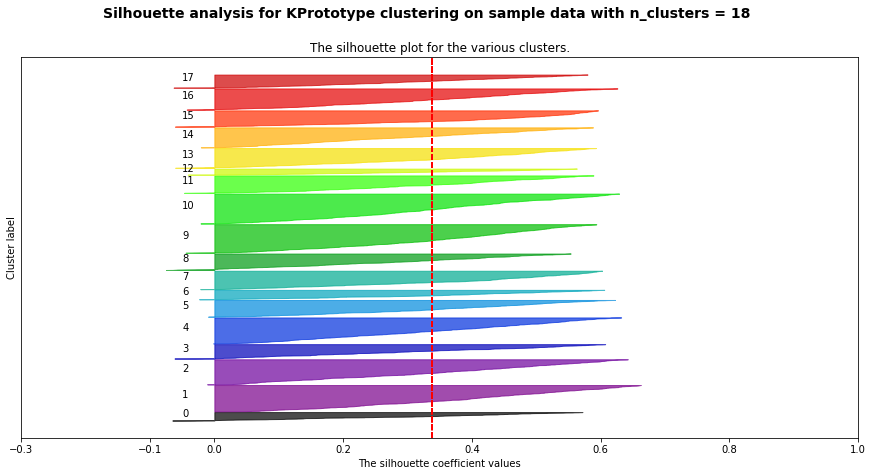

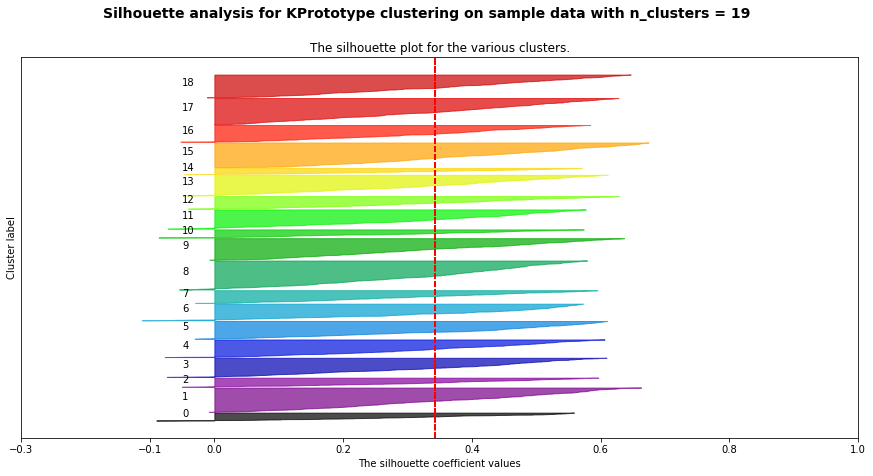

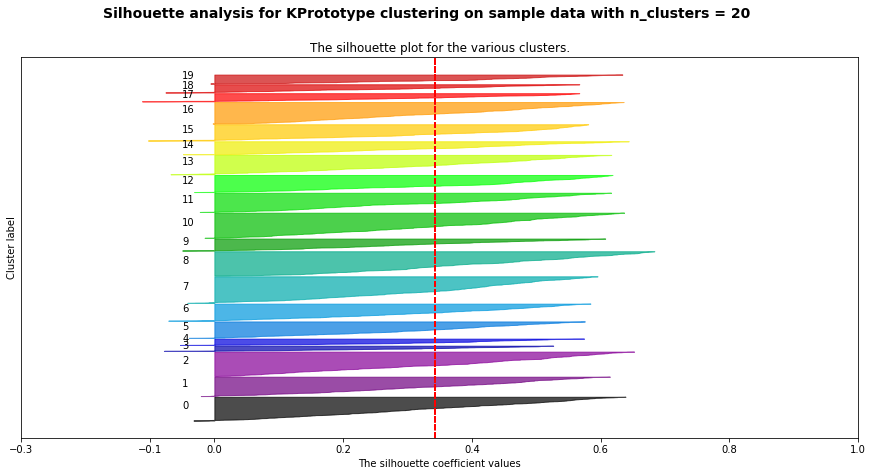

In [ ]:
from sklearn.cluster import KMeans
#Choose optimal K using Elbow and silohouette methods
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import matplotlib.style as style


elbow_lost_ica = []
silhouette_avg_list_ica = []

for cluster in range(2, 21):

    fig, ax1 = plt.subplots()
    fig.set_size_inches(15, 7)

    kmeans_ica = KMeans(n_clusters= cluster, random_state= 0)
    cluster_labels_ica = kmeans_ica.fit_predict(df_ica_X_optimal)
    #The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    #clusters

    silhouette_avg_ica = silhouette_score(df_ica_X_optimal, cluster_labels_ica)
    silhouette_avg_list_ica.append(silhouette_avg_ica)
    elbow_lost_ica.append(kmeans_ica.inertia_)
    print(f'For {cluster} number of clusters, the average Silhouette score is {silhouette_avg_ica}')

    # Compute the silhouette scores for each sample
    sample_silhouette_values_ica = silhouette_samples(df_ica_X_optimal, cluster_labels_ica)

    y_lower = 10
    for i in range(cluster):
      # Aggregate the silhouette scores for samples belonging to
      # cluster i, and sort them
      ith_cluster_silhouette_values_ica = \
            sample_silhouette_values_ica[cluster_labels_ica == i]

      ith_cluster_silhouette_values_ica.sort()

      size_cluster_i = ith_cluster_silhouette_values_ica.shape[0]
      y_upper = y_lower + size_cluster_i

      color = cm.nipy_spectral(float(i) / cluster)
      ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values_ica,
                          facecolor=color, edgecolor=color, alpha=0.7)

      # Label the silhouette plots with their cluster numbers at the middle
      ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

      # Compute the new y_lower for next plot
      y_lower = y_upper + 10  # 10 for the 0 samples

      ax1.set_title("The silhouette plot for the various clusters.")
      ax1.set_xlabel("The silhouette coefficient values")
      ax1.set_ylabel("Cluster label")

      # The vertical line for average silhouette score of all the values
      ax1.axvline(x=silhouette_avg_ica, color="red", linestyle="--")

      ax1.set_yticks([])  # Clear the yaxis labels / ticks
      ax1.set_xticks([-0.3, -0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
      plt.suptitle(("Silhouette analysis for KPrototype clustering on sample data "
                  "with n_clusters = %d" % cluster),
                  fontsize=14, fontweight='bold')
      plt.subplots_adjust(hspace=0.4)


plt.show()

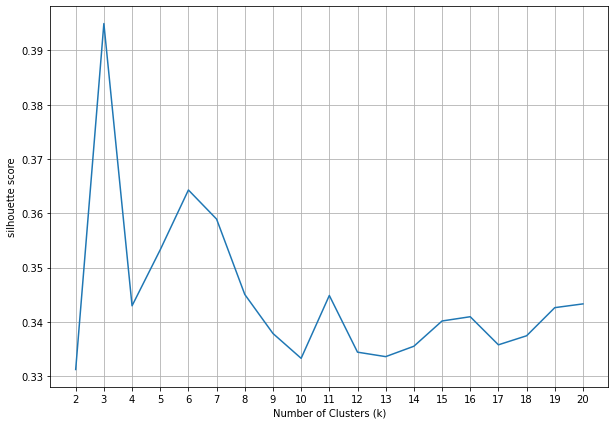

In [ ]:
figure(figsize=(10,7))
plt.grid()
plt.plot(range(2,21), silhouette_avg_list_ica)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("silhouette score")
plt.xticks(range(2,21))
plt.show()

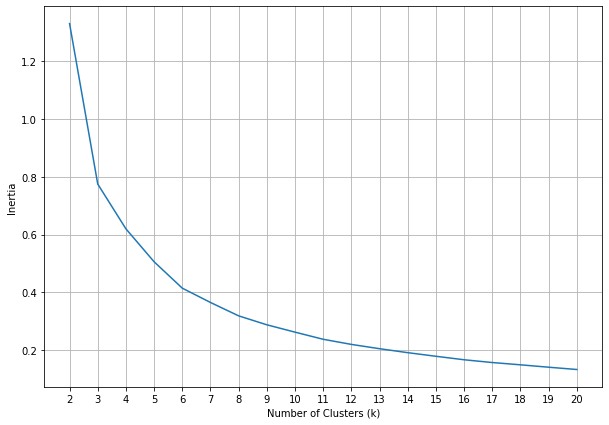

In [ ]:
figure(figsize=(10,7))
plt.grid()
plt.plot(range(2,21), elbow_lost_ica)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.xticks(range(2,21))
plt.show()

In [ ]:
# K=3 based on silhouette score

kmeans_optimal_ica = KMeans(n_clusters= 3, random_state= 0)
kmeans_optimal_ica.fit(df_ica_X_optimal)
cluster_labels_ica_optimal = kmeans_optimal_ica.predict(df_ica_X_optimal)

In [ ]:
df_ica_X_optimal_viz = df_ica_X_optimal.copy()
df_ica_X_optimal_viz['Cluster Labels'] = cluster_labels_ica_optimal

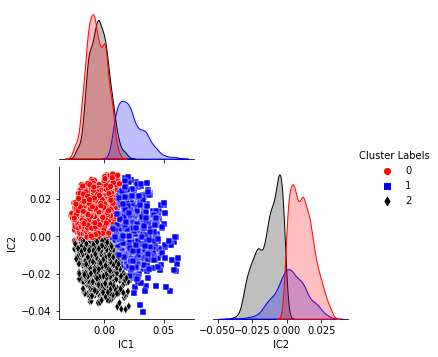

In [ ]:
import seaborn as sns

sns.pairplot(df_ica_X_optimal_viz, hue = 'Cluster Labels', palette= ['r', 'blue', 'black'], markers=['o', 's', 'd'], corner = True)

In [ ]:
df_ica_X_optimal_viz_org = X_ica.copy()
df_ica_X_optimal_viz_org['Cluster Labels'] = cluster_labels_ica_optimal

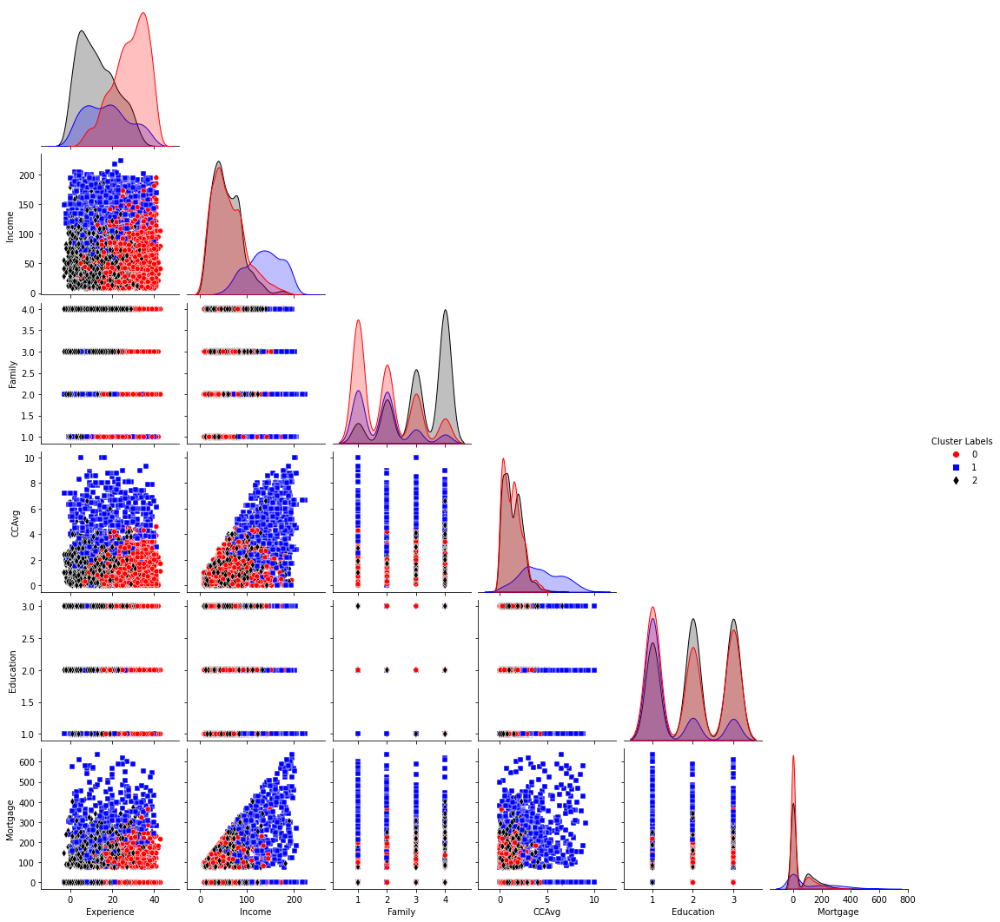

In [ ]:
import seaborn as sns

sns.pairplot(df_ica_X_optimal_viz_org, hue = 'Cluster Labels', palette= ['r', 'blue', 'black'], markers=['o', 's', 'd'], corner = True)

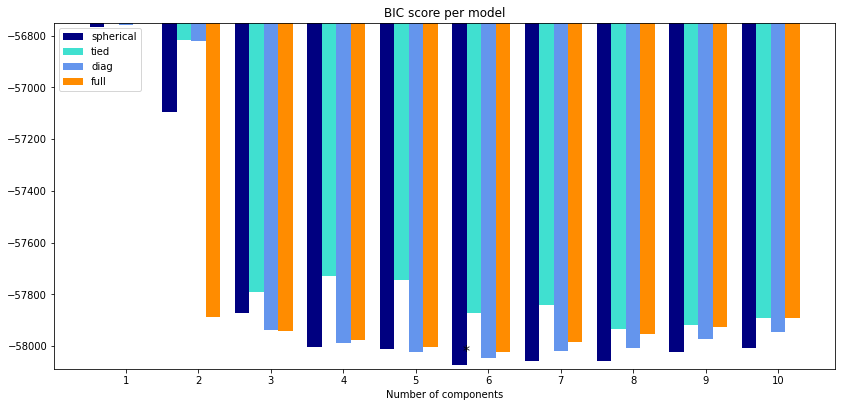

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, mixture
import itertools

# Fit the data using a Gaussian mixture model and calculate the BIC for
# different numbers of clusters, ranging for 1 to 10
lowest_bic_ica = np.infty
bic_ica = []
n_components_range_ica = range(1, 11)
cv_types = ["spherical", "tied", "diag", "full"]
for cv_type in cv_types:
    for n_components in n_components_range_ica:
        # Fit a Gaussian mixture with EM
        gmm_ica = mixture.GaussianMixture(
            n_components=n_components, covariance_type=cv_type, random_state=0
        )
        gmm_ica.fit(df_ica_X_optimal)
        bic_ica.append(gmm_ica.bic(df_ica_X_optimal))
        if bic_ica[-1] < lowest_bic_ica:
            lowest_bic_ica = bic_ica[-1]
            best_gmm_ica = gmm_ica

bic_ica = np.array(bic_ica)
color_iter = itertools.cycle(["navy", "turquoise", "cornflowerblue", "darkorange"])
clf_ica = best_gmm_ica
bars_ica = []

# Plot the BIC scores
plt.figure(figsize=(14, 14))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range_ica) + 0.2 * (i - 2)
    bars_ica.append(
        plt.bar(
            xpos,
            bic_ica[i * len(n_components_range_ica) : (i + 1) * len(n_components_range_ica)],
            width=0.2,
            color=color,
        )
    )
plt.xticks(n_components_range_ica)
plt.ylim([bic_ica.min() * 1.01 - 0.01 * bic_ica.max(), bic_ica.max()])
plt.title("BIC score per model")
xpos = (
    np.mod(bic_ica.argmin(), len(n_components_range_ica))
    + 0.65
    + 0.2 * np.floor(bic_ica.argmin() / len(n_components_range_ica))
)
plt.text(xpos, bic_ica.min() * 0.97 + 0.03 * bic_ica.max(), "*", fontsize=14)
spl.set_xlabel("Number of components")
spl.legend([b[0] for b in bars_ica], cv_types)

In [ ]:
# Choosing K=6 and covariance of "Spherical" based on BIC score

gmm_optimal_ica = mixture.GaussianMixture(n_components= 6, covariance_type="spherical", random_state= 0)
gmm_optimal_ica.fit(df_ica_X_optimal)
cluster_labels_ica_optimal_gmm = gmm_optimal_ica.predict(df_ica_X_optimal)

In [ ]:
df_ica_reduced_gmm_viz = df_ica_X_optimal.copy()
df_ica_reduced_gmm_viz['Cluster Labels'] = cluster_labels_ica_optimal_gmm

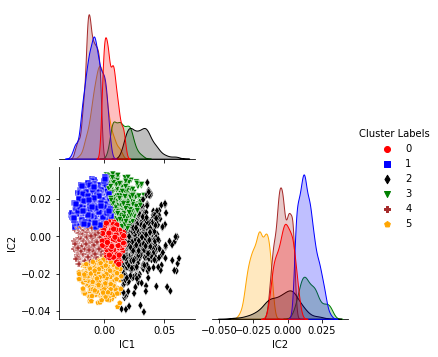

In [ ]:
sns.pairplot(df_ica_reduced_gmm_viz, hue = 'Cluster Labels', palette= ['red', 'blue', 'black', 'green', 'brown', 'orange'], markers=['o', 's', 'd', 'v', 'P', 'p'], corner = True)

In [ ]:
df_ica_reduced_gmm_viz_org = X_ica.copy()
df_ica_reduced_gmm_viz_org['Cluster Labels'] = cluster_labels_ica_optimal_gmm

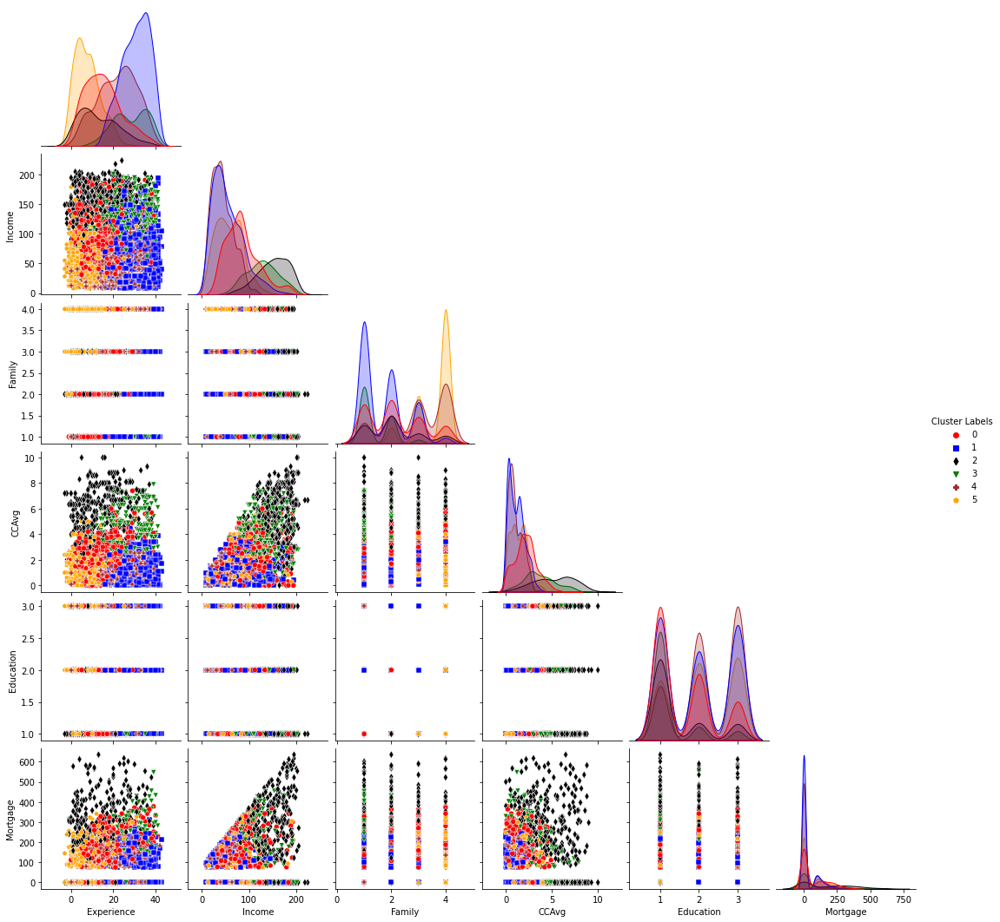

In [ ]:
sns.pairplot(df_ica_reduced_gmm_viz_org, hue = 'Cluster Labels', palette= ['red', 'blue', 'black', 'green', 'brown', 'orange'], markers=['o', 's', 'd', 'v', 'P', 'p'], corner = True)

In [ ]:
X_rca = df.drop(['Personal Loan', 'ID', 'ZIP Code','Age','Securities Account', 'CD Account', 'Online', 'CreditCard'], axis=1)
y = df['Personal Loan']

In [ ]:
normal_col = ['Experience','Education', 'Family',]
skewd_col = ['CCAvg', 'Income', 'Mortgage']

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.compose import ColumnTransformer

normal_pipeline = Pipeline(steps = [('scale', StandardScaler())])
skewd_pipline = Pipeline(steps = [('sk_scale', RobustScaler())])

full_preprocessor = ColumnTransformer(transformers=[
        ('normal_transform', normal_pipeline, normal_col),
        ('skewd_transform', skewd_pipline, skewd_col)], remainder ='passthrough')

X_rca_scaled = full_preprocessor.fit_transform(X_rca)

df_X_rca_scaled = pd.DataFrame(X_rca_scaled, columns= X_rca.columns)

In [ ]:
import numpy as np

from sklearn.random_projection import GaussianRandomProjection

A = df_X_rca_scaled.to_numpy()

reconstruction_norm = []

for i in range(1, df_X_rca_scaled.shape[1] + 1):
  rca = GaussianRandomProjection(n_components = i, random_state = 0)
  rca.fit(df_X_rca_scaled)
  X_rca_transformed = rca.transform(df_X_rca_scaled)

  W = rca.components_
  W_pinv = np.linalg.pinv(W).transpose()
  B = np.dot(X_rca_transformed, W_pinv)

  reconstruction_norm.append(np.linalg.norm(A - B))

Text(0, 0.5, 'Reconstruction Norm')

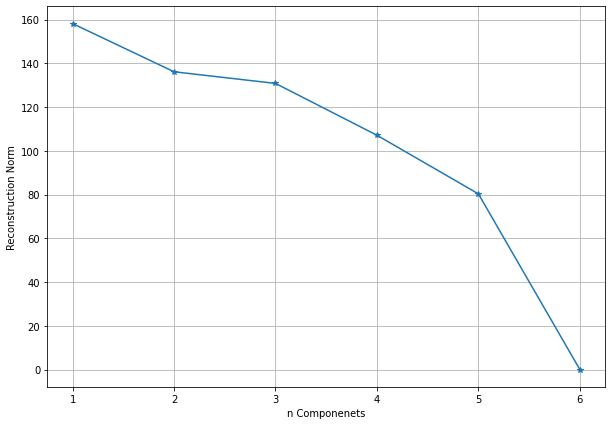

In [ ]:
#plotting Reconstruction Error
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

figure(figsize=(10,7))
plt.grid()
plt.plot(range(1, X_rca.shape[1] + 1), reconstruction_norm, marker = '*')
plt.xlabel('n Componenets')
plt.ylabel('Reconstruction Norm')

In [ ]:
# n = 5 is decided based on graph

rca_optimal = GaussianRandomProjection(n_components = 5, random_state=0)
rca_optimal.fit(df_X_rca_scaled)
X_rca_optimal_transformed = rca_optimal.transform(df_X_rca_scaled)

For 2 number of clusters, the average Silhouette score is 0.3135020348001506
For 3 number of clusters, the average Silhouette score is 0.24214698928691356
For 4 number of clusters, the average Silhouette score is 0.2633471379054143
For 5 number of clusters, the average Silhouette score is 0.2754642735633653
For 6 number of clusters, the average Silhouette score is 0.25383071054979084
For 7 number of clusters, the average Silhouette score is 0.25493949785143294
For 8 number of clusters, the average Silhouette score is 0.24694365849964675
For 9 number of clusters, the average Silhouette score is 0.25431185090247244
For 10 number of clusters, the average Silhouette score is 0.2414049519877828
For 11 number of clusters, the average Silhouette score is 0.23606445399289178
For 12 number of clusters, the average Silhouette score is 0.23031483925395077
For 13 number of clusters, the average Silhouette score is 0.2349684413817404
For 14 number of clusters, the average Silhouette score is 0.2341

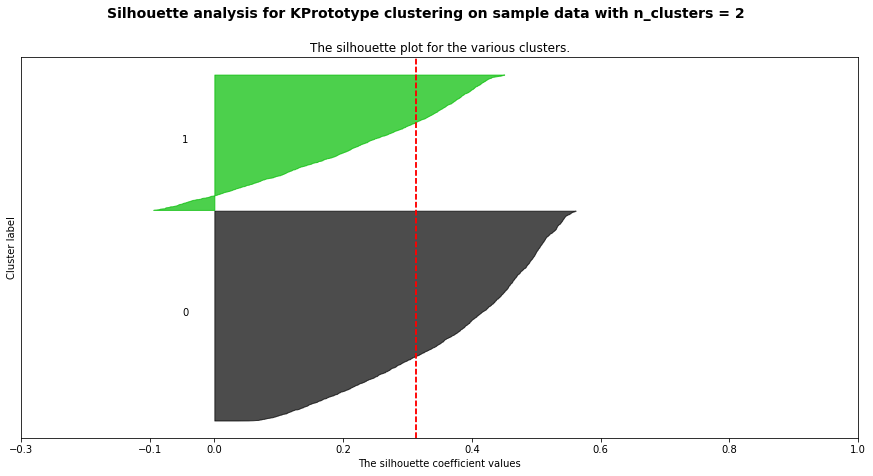

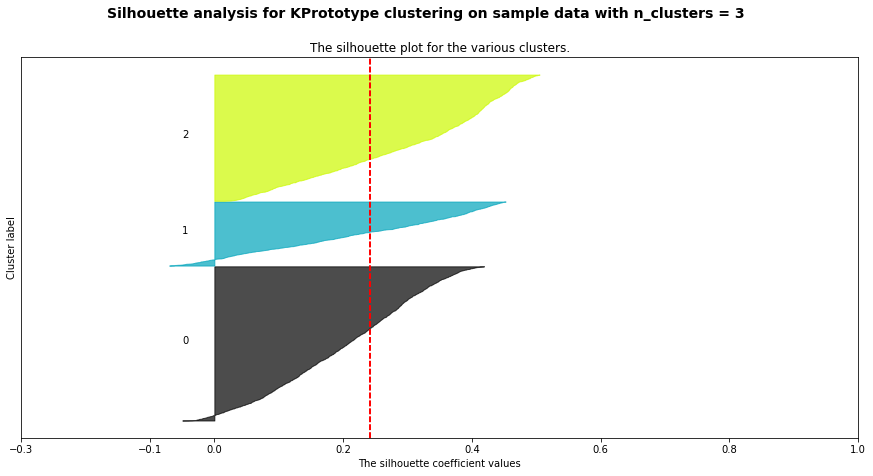

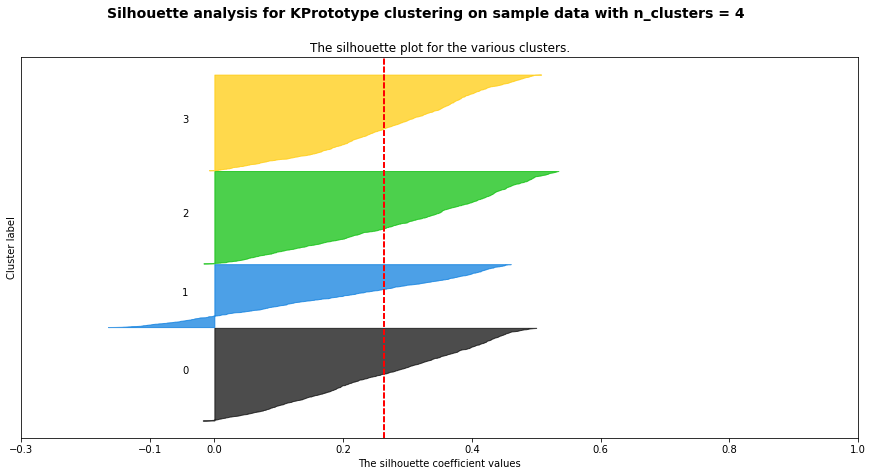

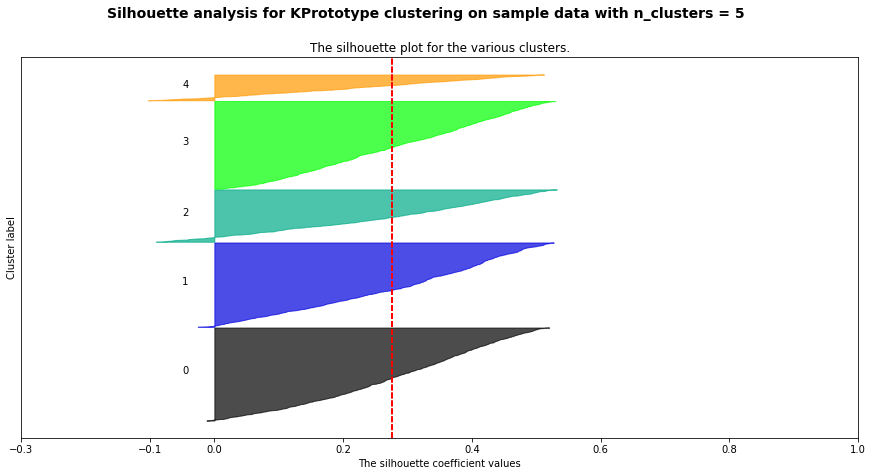

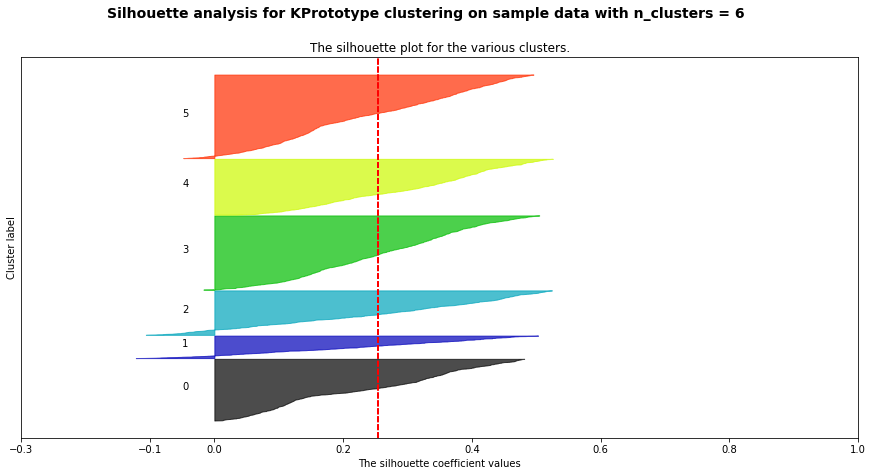

...

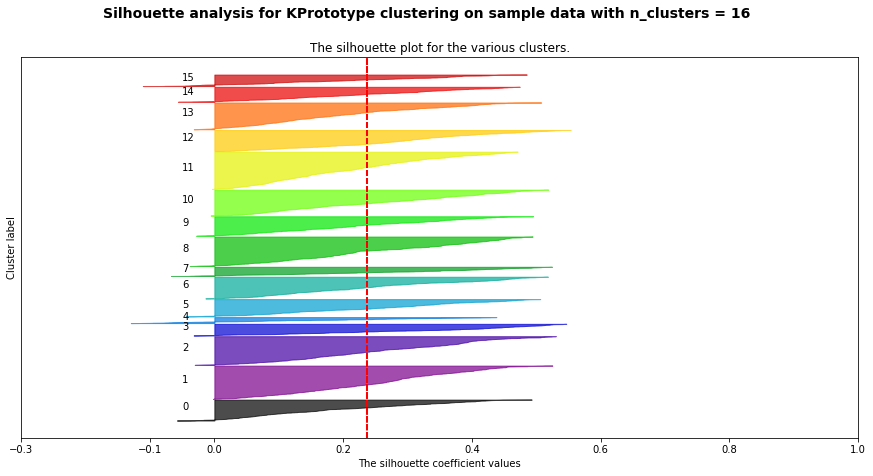

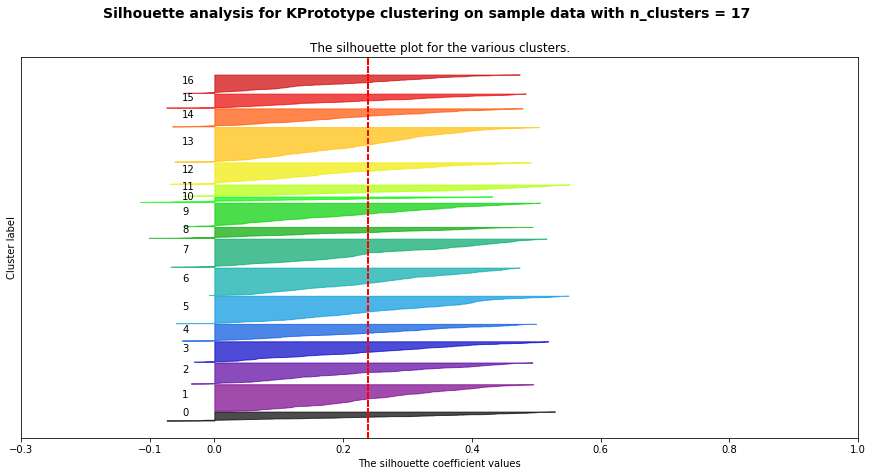

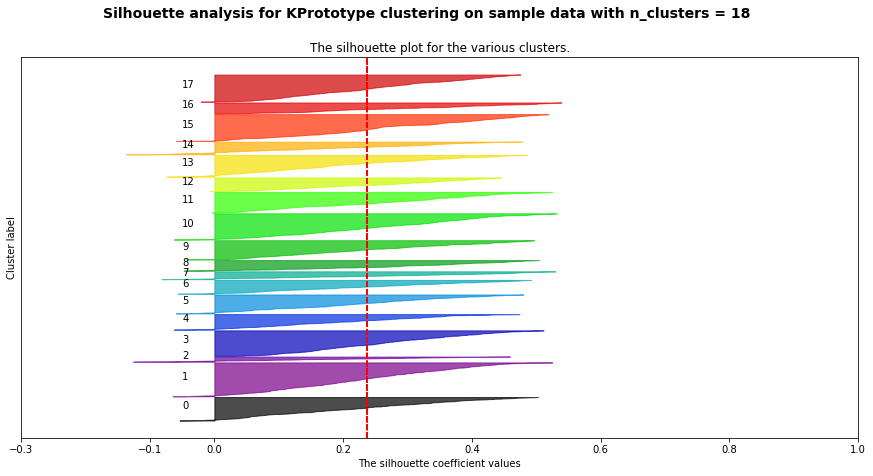

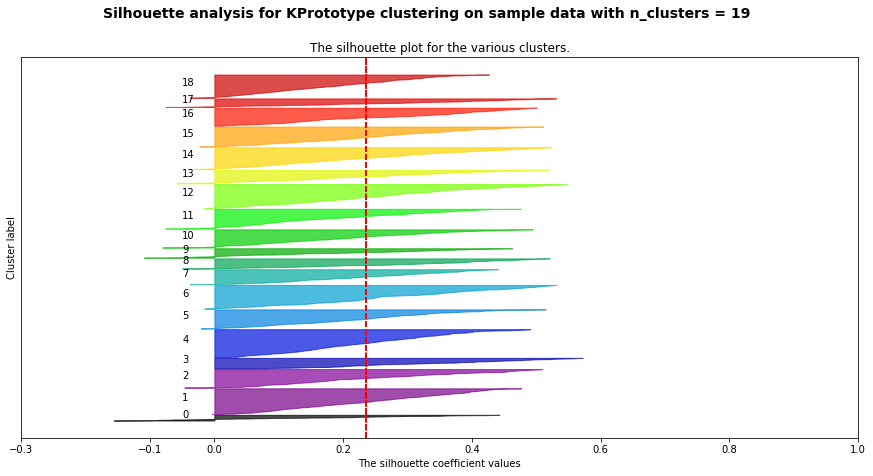

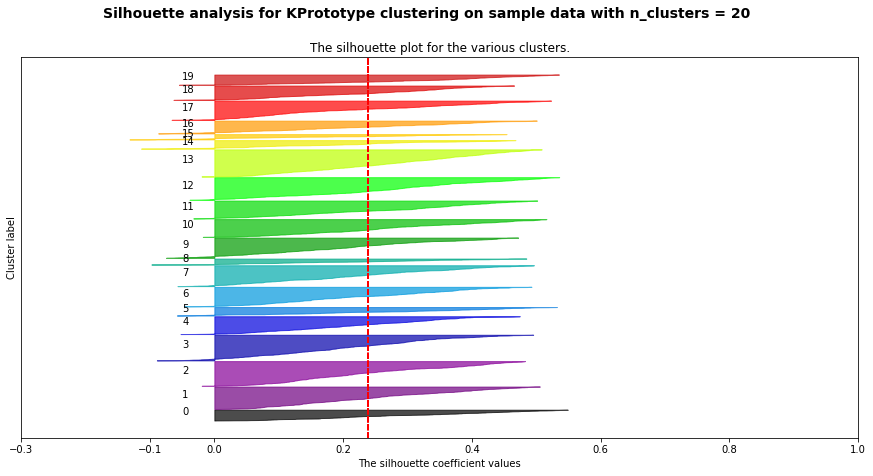

In [ ]:
from sklearn.cluster import KMeans
from sklearn.cluster import KMeans
#Choose optimal K using Elbow and silohouette methods
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import matplotlib.style as style


elbow_lost_rca = []
silhouette_avg_list_rca = []

for cluster in range(2, 21):

    fig, ax1 = plt.subplots()
    fig.set_size_inches(15, 7)

    kmeans = KMeans(n_clusters= cluster, random_state= 0)
    cluster_labels_rca = kmeans.fit_predict(X_rca_optimal_transformed)
    #The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    #clusters

    silhouette_avg_rca = silhouette_score(X_rca_optimal_transformed, cluster_labels_rca)
    silhouette_avg_list_rca.append(silhouette_avg_rca)
    elbow_lost_rca.append(kmeans.inertia_)
    print(f'For {cluster} number of clusters, the average Silhouette score is {silhouette_avg_rca}')

    # Compute the silhouette scores for each sample
    sample_silhouette_values_rca = silhouette_samples(X_rca_optimal_transformed, cluster_labels_rca)

    y_lower = 10
    for i in range(cluster):
      # Aggregate the silhouette scores for samples belonging to
      # cluster i, and sort them
      ith_cluster_silhouette_values_rca = \
            sample_silhouette_values_rca[cluster_labels_rca == i]

      ith_cluster_silhouette_values_rca.sort()

      size_cluster_i = ith_cluster_silhouette_values_rca.shape[0]
      y_upper = y_lower + size_cluster_i

      color = cm.nipy_spectral(float(i) / cluster)
      ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values_rca,
                          facecolor=color, edgecolor=color, alpha=0.7)

      # Label the silhouette plots with their cluster numbers at the middle
      ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

      # Compute the new y_lower for next plot
      y_lower = y_upper + 10  # 10 for the 0 samples

      ax1.set_title("The silhouette plot for the various clusters.")
      ax1.set_xlabel("The silhouette coefficient values")
      ax1.set_ylabel("Cluster label")

      # The vertical line for average silhouette score of all the values
      ax1.axvline(x=silhouette_avg_rca, color="red", linestyle="--")

      ax1.set_yticks([])  # Clear the yaxis labels / ticks
      ax1.set_xticks([-0.3, -0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
      plt.suptitle(("Silhouette analysis for KPrototype clustering on sample data "
                  "with n_clusters = %d" % cluster),
                  fontsize=14, fontweight='bold')
      plt.subplots_adjust(hspace=0.4)


plt.show()

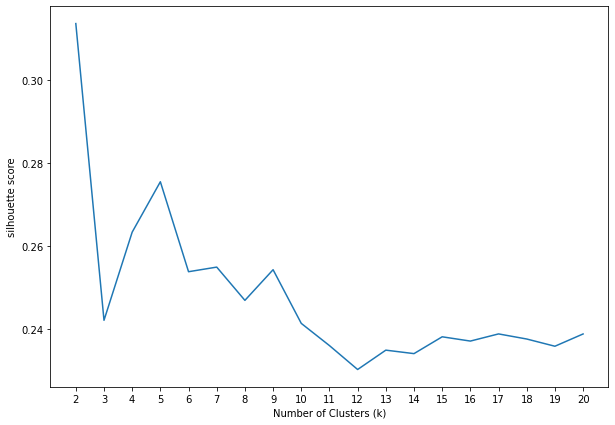

In [ ]:
figure(figsize=(10,7))
plt.plot(range(2,21), silhouette_avg_list_rca)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("silhouette score")
plt.xticks(range(2,21))
plt.show()

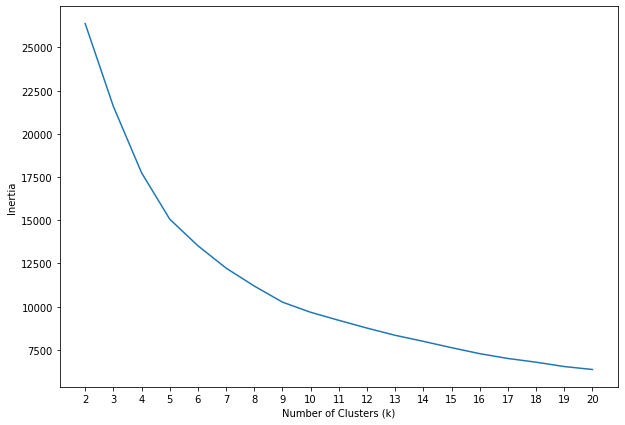

In [ ]:
figure(figsize=(10,7))
plt.plot(range(2,21), elbow_lost_rca)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.xticks(range(2,21))
plt.show()

In [ ]:
# K=5 based on silhouette score

kmeans_optimal_rca = KMeans(n_clusters= 5, random_state= 0)
kmeans_optimal_rca.fit(X_rca_optimal_transformed)
cluster_labels_rca_optimal = kmeans_optimal_rca.predict(X_rca_optimal_transformed)

In [ ]:
df_X_rca_optimal_transformed = pd.DataFrame(X_rca_optimal_transformed, columns = ['RC1', 'RC2', 'RC3', 'RC4', 'RC5'])

In [ ]:
df_X_rca_optimal_transformed.shape

(5000, 5)

In [ ]:
df_rca_X_optimal_viz = df_X_rca_optimal_transformed.copy()
df_rca_X_optimal_viz['Cluster Labels'] = cluster_labels_rca_optimal
df_rca_X_optimal_viz['True Label'] = y

In [ ]:
df_rca_X_optimal_viz.head(20)

,RC1,RC2,RC3,RC4,RC5,Cluster Labels,True Label
0,-1.047129,-0.707575,-0.508324,-1.510073,-1.159174,1,0
1,-0.458182,-0.026954,-0.325210,-0.409888,0.246766,0,0
2,-2.100194,-0.170839,-1.091817,1.299235,-0.386955,0,0
3,-0.093536,-0.203169,-0.056252,1.630367,-0.737617,0,0
4,-0.743113,-0.594375,-0.330802,-2.003083,-1.332587,1,0
5,-1.630387,0.510312,-0.554142,-2.653668,-0.039519,1,0
6,0.461807,0.270591,0.234404,0.476876,0.604107,0,0
7,-1.288820,-0.057957,-0.628552,0.457855,-0.978897,1,0
8,-1.150065,0.188148,-0.164356,-1.154570,-0.059879,1,0
9,4.703909,0.436062,1.428533,2.706554,-0.870990,2,1


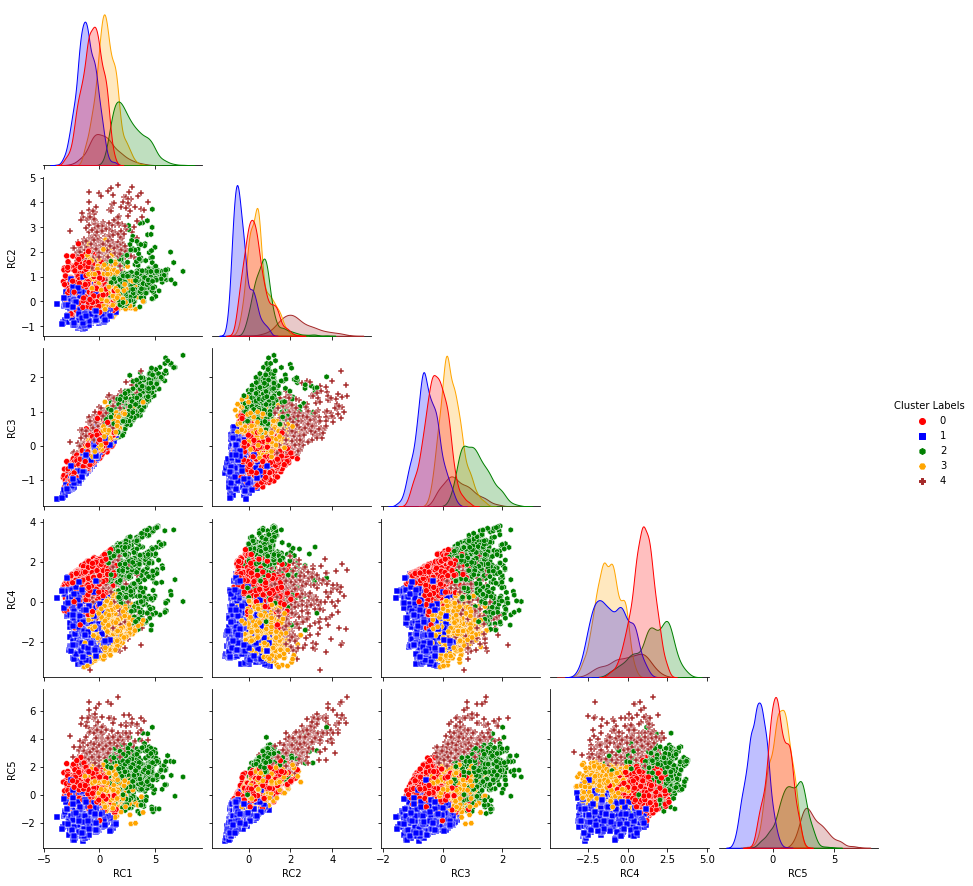

In [ ]:
import seaborn as sns

sns.pairplot(df_rca_X_optimal_viz.drop(['True Label'], axis=1), hue = 'Cluster Labels', palette= ['red', 'blue', 'green', 'orange', 'brown'], markers=['o', 's', 'h', 'H', 'P'], corner = True)

In [ ]:
df_rca_X_optimal_viz_org = X_rca.copy()
df_rca_X_optimal_viz_org['Cluster Labels'] = cluster_labels_rca_optimal

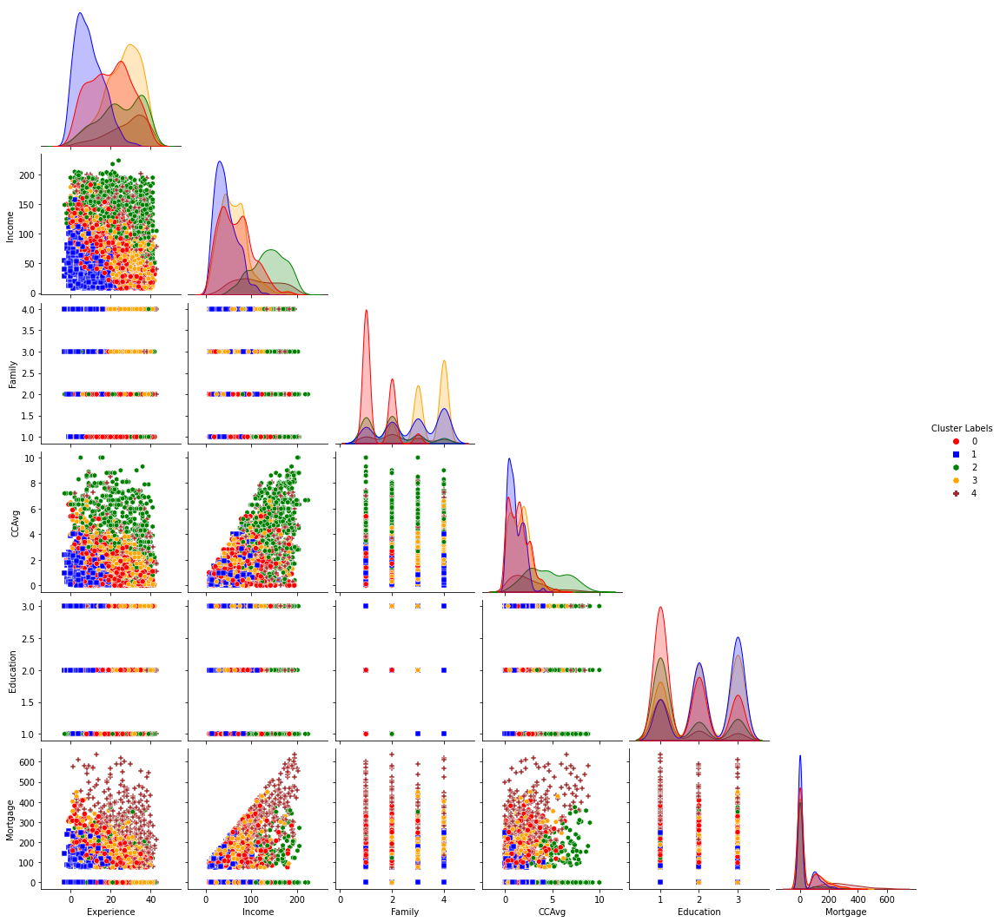

In [ ]:
import seaborn as sns

sns.pairplot(df_rca_X_optimal_viz_org, hue = 'Cluster Labels', palette= ['red', 'blue', 'green', 'orange', 'brown'], markers=['o', 's', 'h', 'H', 'P'], corner = True)

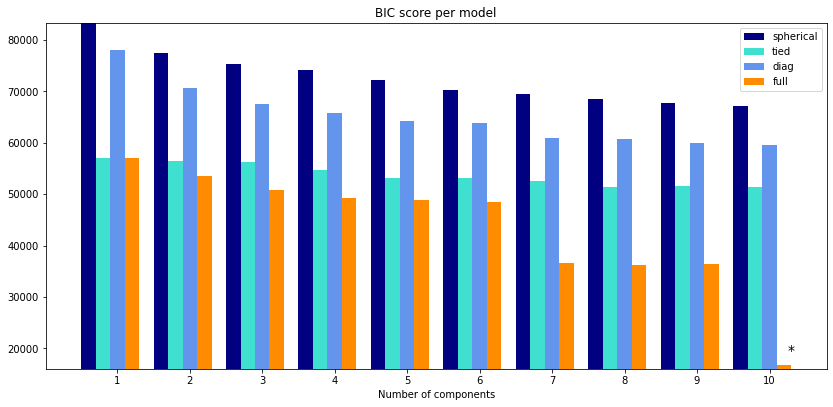

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets, mixture
import itertools

# Fit the data using a Gaussian mixture model and calculate the BIC for
# different numbers of clusters, ranging for 1 to 10
lowest_bic_rca = np.infty
bic_rca = []
n_components_range_rca = range(1, 11)
cv_types = ["spherical", "tied", "diag", "full"]
for cv_type in cv_types:
    for n_components in n_components_range_rca:
        # Fit a Gaussian mixture with EM
        gmm_rca = mixture.GaussianMixture(
            n_components=n_components, covariance_type=cv_type, random_state=0
        )
        gmm_rca.fit(X_rca_optimal_transformed)
        bic_rca.append(gmm_rca.bic(X_rca_optimal_transformed))
        if bic_rca[-1] < lowest_bic_rca:
            lowest_bic_rca = bic_rca[-1]
            best_gmm_rca = gmm_rca

bic_rca = np.array(bic_rca)
color_iter = itertools.cycle(["navy", "turquoise", "cornflowerblue", "darkorange"])
clf_rca = best_gmm_rca
bars_rca = []

# Plot the BIC scores
plt.figure(figsize=(14, 14))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range_rca) + 0.2 * (i - 2)
    bars_rca.append(
        plt.bar(
            xpos,
            bic_rca[i * len(n_components_range_rca) : (i + 1) * len(n_components_range_rca)],
            width=0.2,
            color=color,
        )
    )
plt.xticks(n_components_range_rca)
plt.ylim([bic_rca.min() * 1.01 - 0.01 * bic_rca.max(), bic_rca.max()])
plt.title("BIC score per model")
xpos = (
    np.mod(bic_rca.argmin(), len(n_components_range_rca))
    + 0.65
    + 0.2 * np.floor(bic_rca.argmin() / len(n_components_range_rca))
)
plt.text(xpos, bic_rca.min() * 0.97 + 0.03 * bic_rca.max(), "*", fontsize=14)
spl.set_xlabel("Number of components")
spl.legend([b[0] for b in bars_rca], cv_types)

In [ ]:
# Choosing K=10 and covariance of "FULL" based on BIC score

gmm_optimal_rca = mixture.GaussianMixture(n_components= 10, covariance_type="full", random_state= 0)
gmm_optimal_rca.fit(X_rca_optimal_transformed)
cluster_labels_rca_optimal_gmm = gmm_optimal_rca.predict(X_rca_optimal_transformed)

In [ ]:
df_rca_reduced_gmm_viz = pd.DataFrame(X_rca_optimal_transformed, columns = ['RC1', 'RC2', 'RC3', 'RC4', 'RC5'])
df_rca_reduced_gmm_viz['Cluster Labels'] = cluster_labels_rca_optimal_gmm

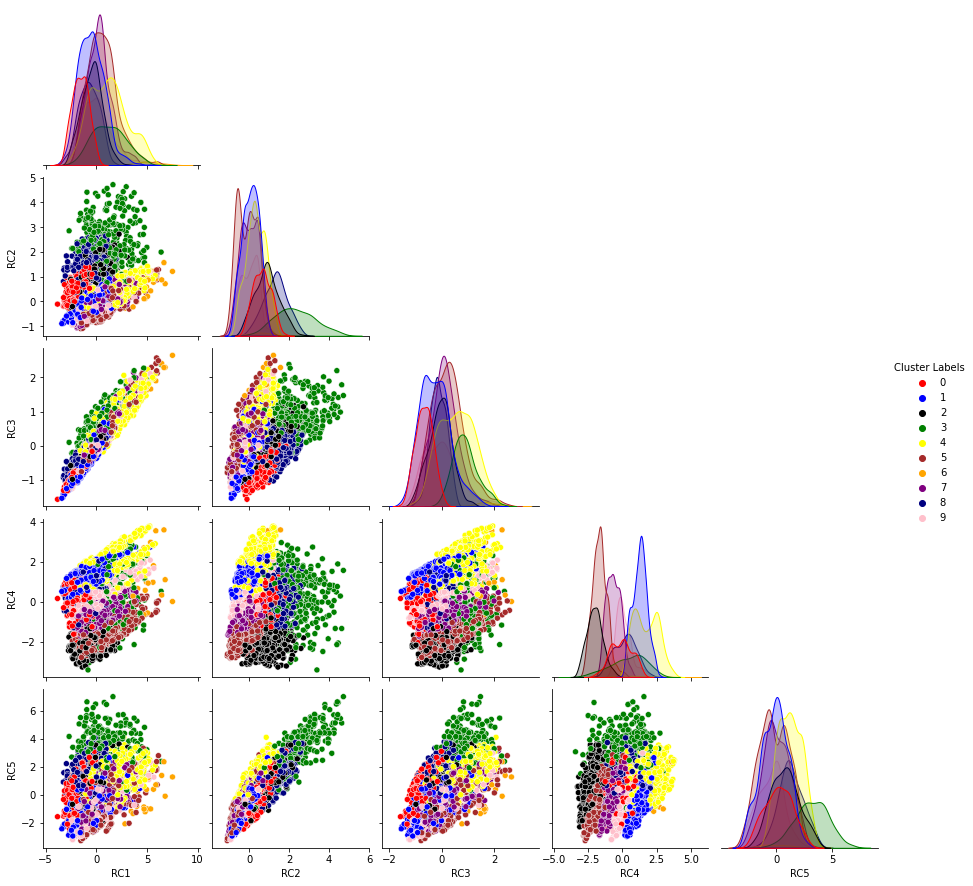

In [ ]:
sns.pairplot(df_rca_reduced_gmm_viz, hue = 'Cluster Labels', palette= ['red', 'blue', 'black', 'green', 'yellow', 'brown', 'orange', 'purple', 'navy', 'pink'], corner = True)

In [ ]:
df_rca_reduced_gmm_viz_org = X_ica.copy()
df_rca_reduced_gmm_viz_org['Cluster Labels'] = cluster_labels_rca_optimal_gmm

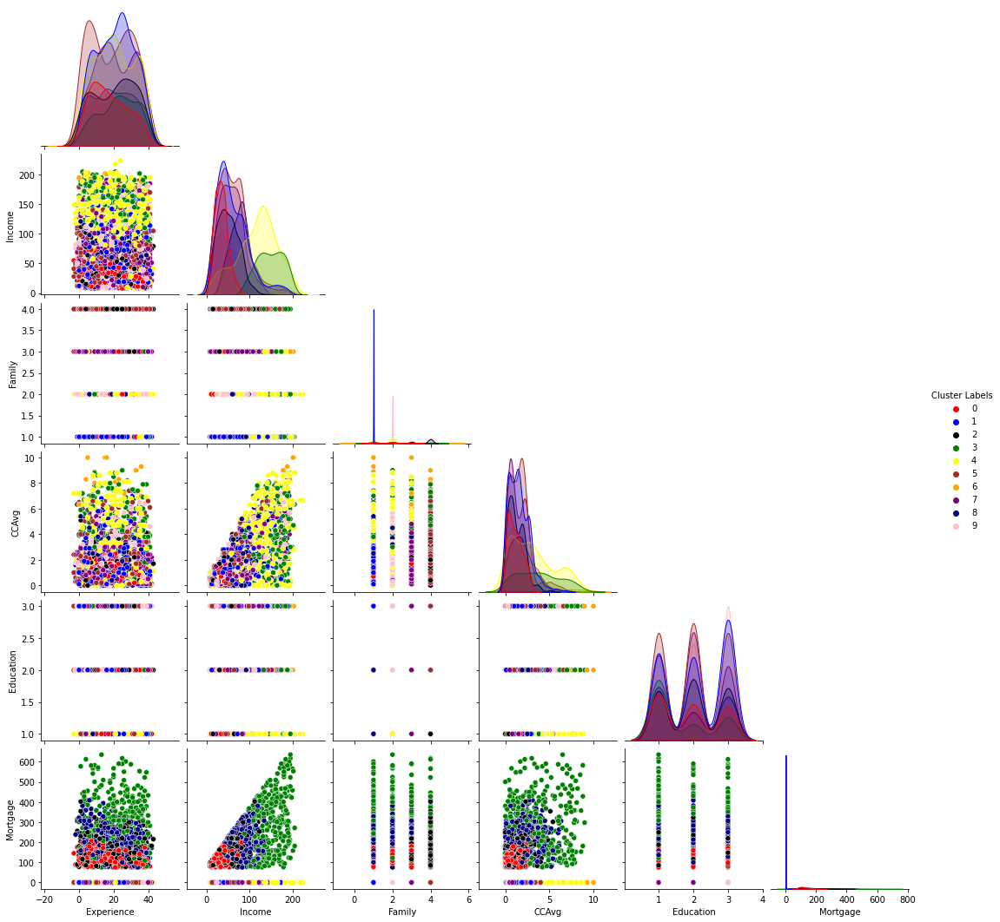

In [ ]:
sns.pairplot(df_rca_reduced_gmm_viz_org, hue = 'Cluster Labels', palette= ['red', 'blue', 'black', 'green', 'yellow', 'brown', 'orange', 'purple', 'navy', 'pink'], corner = True)

In [ ]:
X = df.drop(['Personal Loan', 'ID', 'ZIP Code', 'Age'], axis=1)
y = df['Personal Loan']

In [ ]:
#Split the dataset to train, test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.25,
                                                    random_state=27,stratify=y)

In [ ]:
from sklearn.feature_selection import mutual_info_classif
# determine the mutual information
mutual_info = mutual_info_classif(X_train, y_train)
mutual_info

array([0.        , 0.12874972, 0.00133475, 0.09436675, 0.01537359,
       0.01871989, 0.00276725, 0.02725044, 0.00027887, 0.00406615])

In [ ]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending=False)

Income                0.128750
CCAvg                 0.094367
CD Account            0.027250
Mortgage              0.018720
Education             0.015374
CreditCard            0.004066
Securities Account    0.002767
Family                0.001335
Online                0.000279
Experience            0.000000
dtype: float64

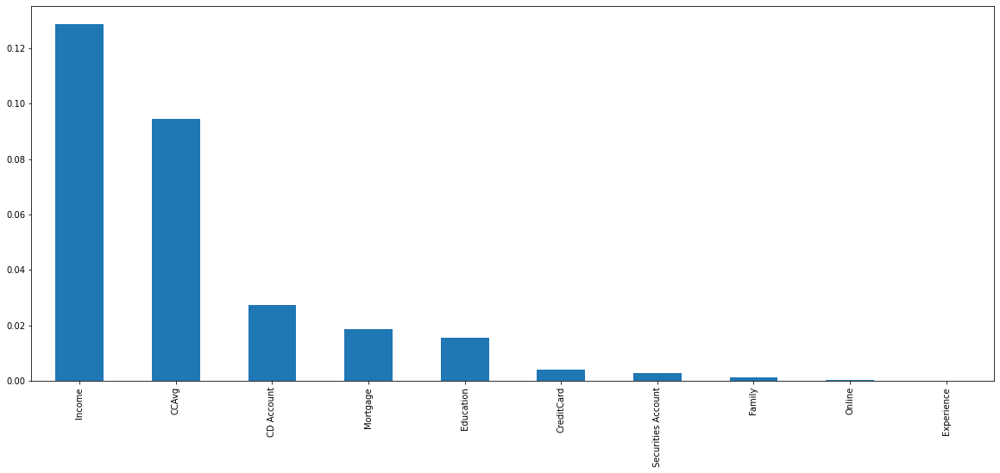

In [ ]:
#let's plot the ordered mutual_info values per feature
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20, 8))

In [ ]:
from sklearn.feature_selection import SelectKBest

In [ ]:
#Select the  top 3 important features
sel_3_cols = SelectKBest(mutual_info_classif, k=3)
sel_3_cols.fit(X_train, y_train)
X_train.columns[sel_3_cols.get_support()]

Index(['Income', 'CCAvg', 'CD Account'], dtype='object')

In [ ]:
X_mi_optimal = X[['Income', 'CCAvg', 'CD Account']]
X_mi_optimal_matrix = X_mi_optimal.to_numpy()

For 2 number of clusters, the average Silhouette score is 0.6397112941580243
For 3 number of clusters, the average Silhouette score is 0.5920537748174418
For 4 number of clusters, the average Silhouette score is 0.5833056304163751
For 5 number of clusters, the average Silhouette score is 0.5613807794031088
For 6 number of clusters, the average Silhouette score is 0.5486290351506119
For 7 number of clusters, the average Silhouette score is 0.5480532649924921
For 8 number of clusters, the average Silhouette score is 0.5500316766400705
For 9 number of clusters, the average Silhouette score is 0.5425779940602049
For 10 number of clusters, the average Silhouette score is 0.5368587410024799


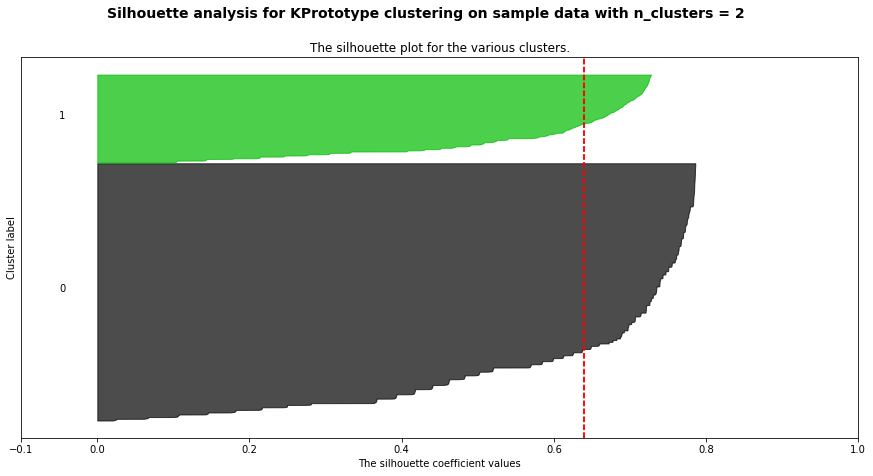

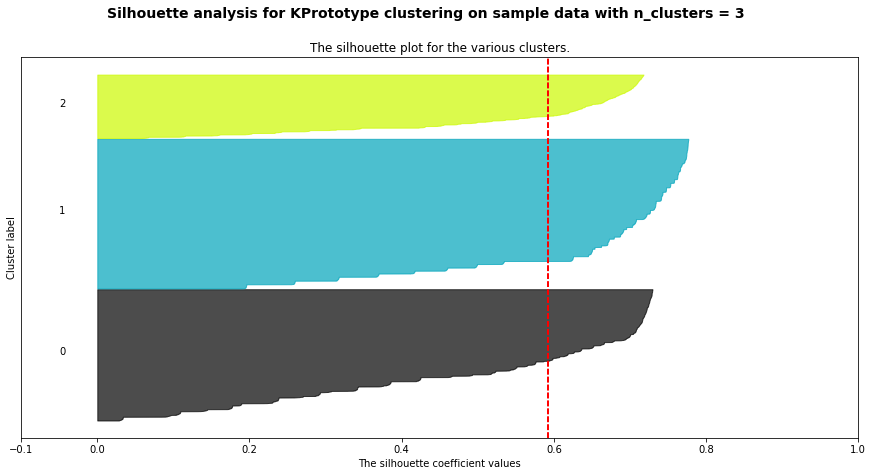

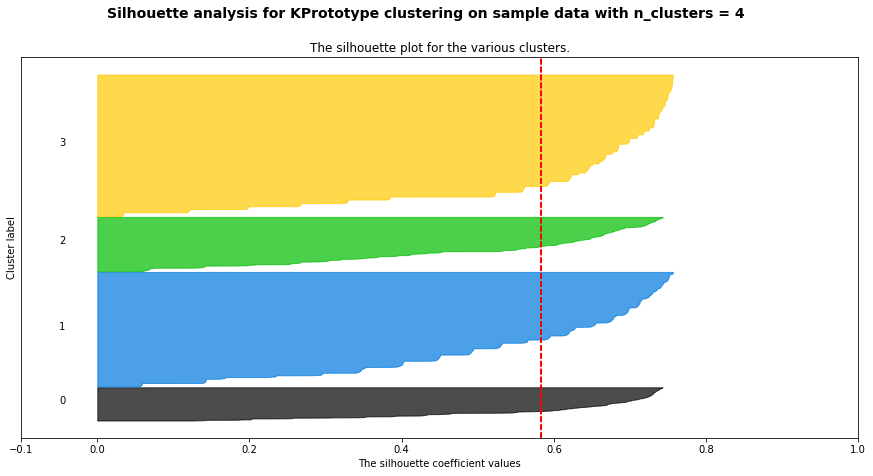

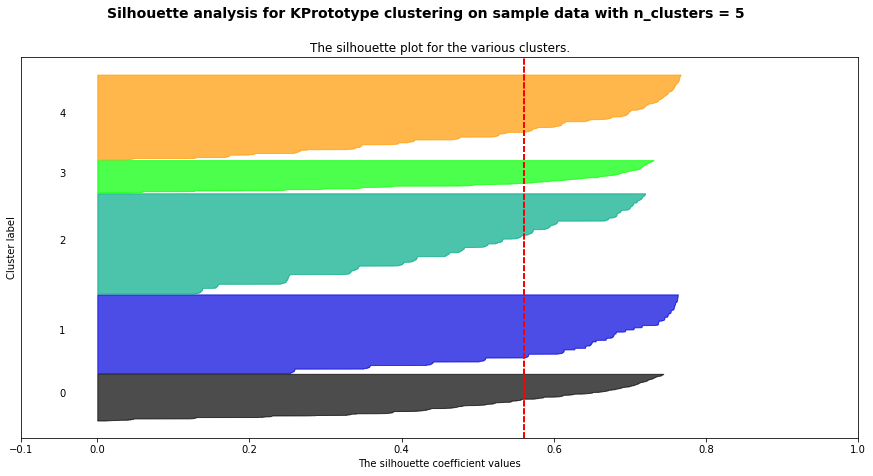

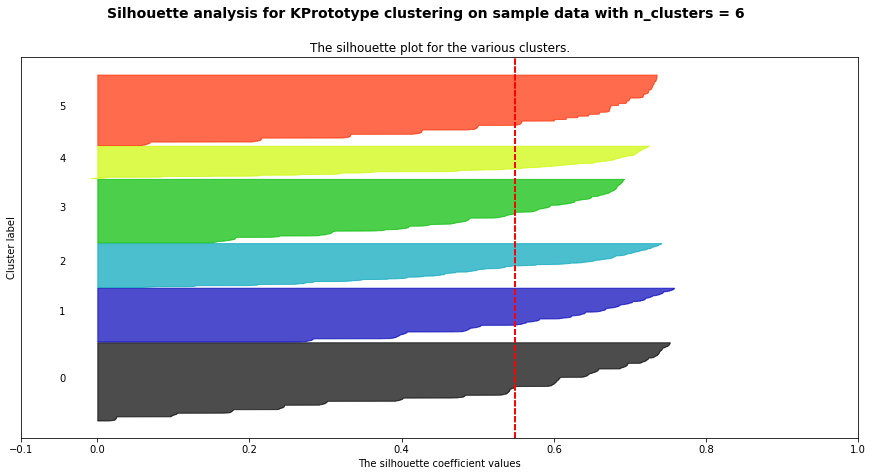

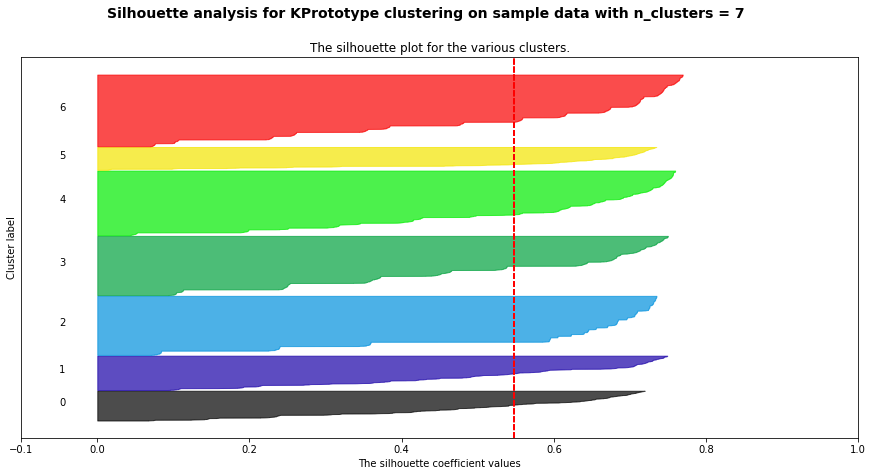

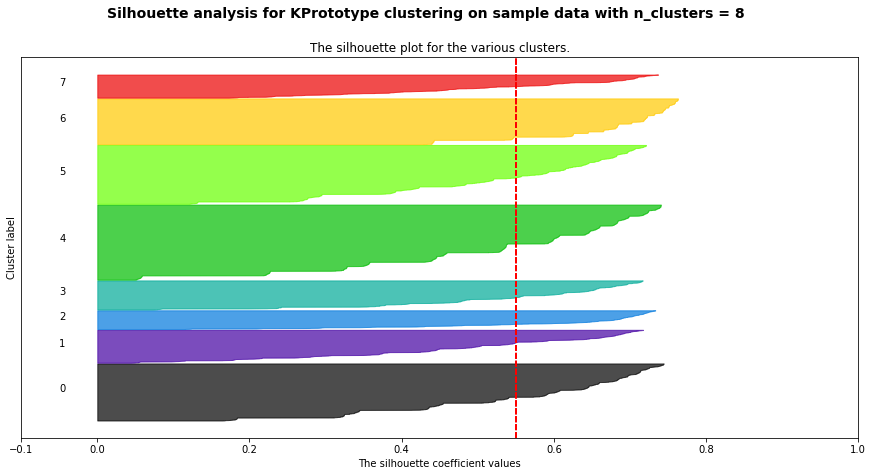

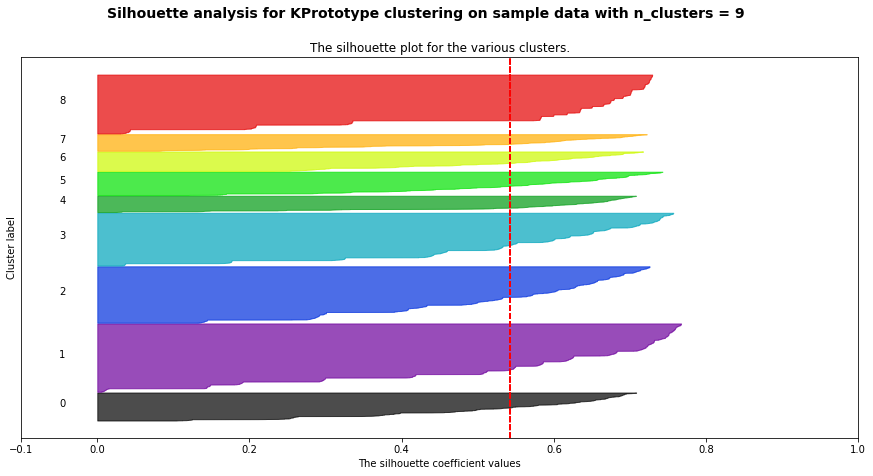

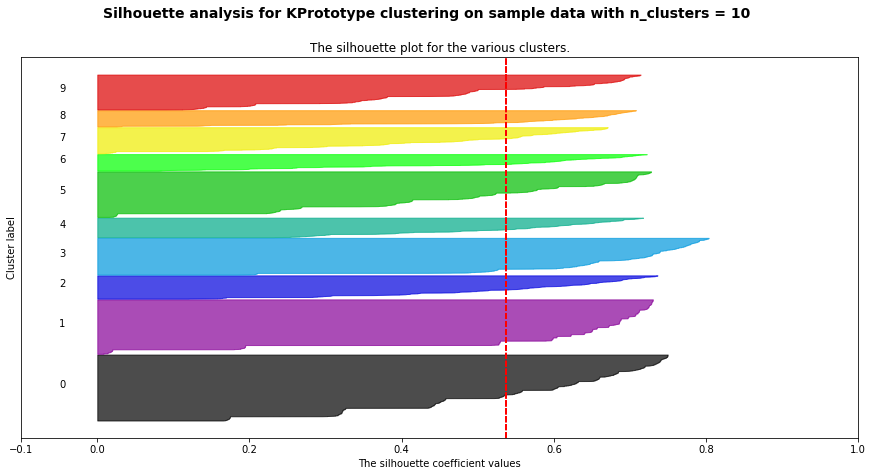

In [ ]:
from kmodes import kprototypes
#Choose optimal K using Elbow and silohouette methods
from kmodes.kprototypes import KPrototypes
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import matplotlib.style as style


elbow_lost_mi = []
silhouette_avg_list_mi = []

for cluster in range(2, 11):

    fig, ax1 = plt.subplots()
    fig.set_size_inches(15, 7)

    kprototype_mi = KPrototypes(n_jobs= -1, n_clusters= cluster, init = 'Huang',
                             random_state= 0)
    cluster_labels_mi = kprototype_mi.fit_predict(X_mi_optimal_matrix, categorical = [2])
    #The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    #clusters

    silhouette_avg_mi = silhouette_score(X_mi_optimal_matrix, cluster_labels_mi)
    silhouette_avg_list_mi.append(silhouette_avg_mi)
    elbow_lost_mi.append(kprototype_mi.cost_)
    print(f'For {cluster} number of clusters, the average Silhouette score is {silhouette_avg_mi}')

    # Compute the silhouette scores for each sample
    sample_silhouette_values_mi = silhouette_samples(X_mi_optimal_matrix, cluster_labels_mi)

    y_lower = 10
    for i in range(cluster):
      # Aggregate the silhouette scores for samples belonging to
      # cluster i, and sort them
      ith_cluster_silhouette_values_mi = \
            sample_silhouette_values_mi[cluster_labels_mi == i]

      ith_cluster_silhouette_values_mi.sort()

      size_cluster_i = ith_cluster_silhouette_values_mi.shape[0]
      y_upper = y_lower + size_cluster_i

      color = cm.nipy_spectral(float(i) / cluster)
      ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values_mi,
                          facecolor=color, edgecolor=color, alpha=0.7)

      # Label the silhouette plots with their cluster numbers at the middle
      ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

      # Compute the new y_lower for next plot
      y_lower = y_upper + 10  # 10 for the 0 samples

      ax1.set_title("The silhouette plot for the various clusters.")
      ax1.set_xlabel("The silhouette coefficient values")
      ax1.set_ylabel("Cluster label")

      # The vertical line for average silhouette score of all the values
      ax1.axvline(x=silhouette_avg_mi, color="red", linestyle="--")

      ax1.set_yticks([])  # Clear the yaxis labels / ticks
      ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
      plt.suptitle(("Silhouette analysis for KPrototype clustering on sample data "
                  "with n_clusters = %d" % cluster),
                  fontsize=14, fontweight='bold')
      plt.subplots_adjust(hspace=0.4)


plt.show()

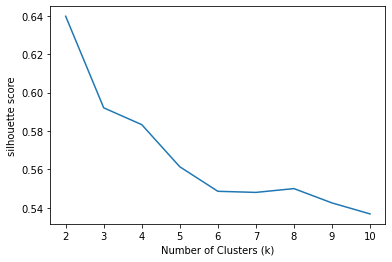

In [ ]:
plt.plot(range(2,11), silhouette_avg_list_mi)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("silhouette score")
plt.show()

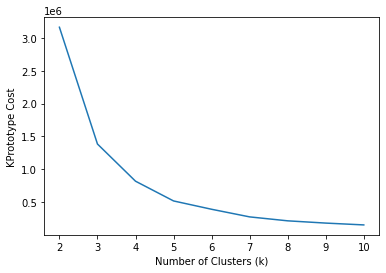

In [ ]:
plt.plot(range(2,11), elbow_lost_mi)
plt.xlabel("Number of Clusters (k)")
plt.ylabel("KPrototype Cost")
plt.show()

In [ ]:
# Choosing K = 3 according to silhouette and Elbow method

kprototype_optimal_mi = KPrototypes(n_jobs= -1, n_clusters= 3, init = 'Huang',
                                random_state = 0)
kprototype_optimal_mi.fit_predict(X_mi_optimal_matrix, categorical = [2])

array([1, 1, 1, ..., 1, 1, 0], dtype=uint16)

In [ ]:
# Adding labels to X data-set
df_X_mi_optimal = pd.DataFrame(X_mi_optimal_matrix, columns = X_mi_optimal.columns)
df_X_mi_optimal['Cluster Labels'] = kprototype_optimal_mi.labels_
df_X_mi_optimal['True Labels'] = y

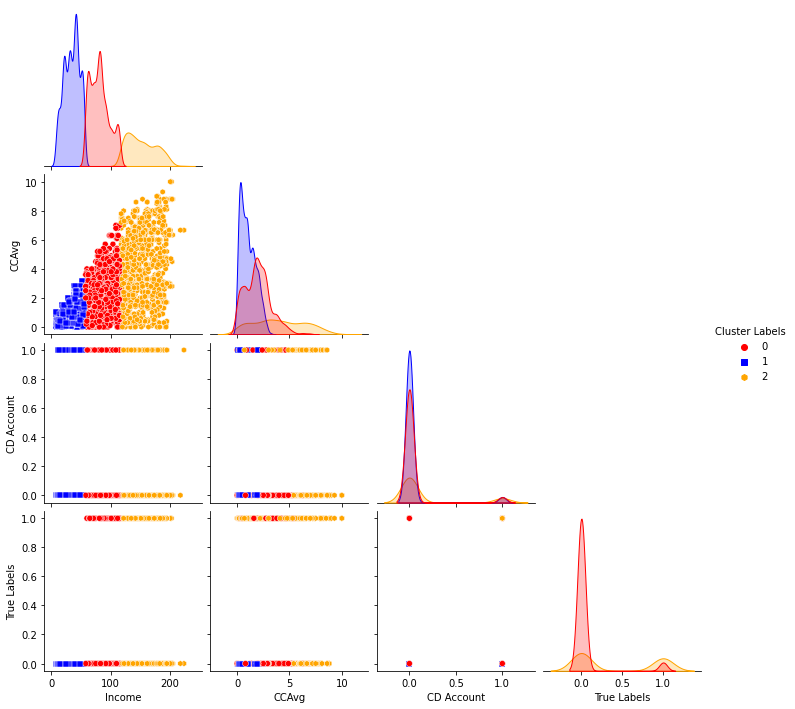

In [ ]:
import seaborn as sns

sns.pairplot(df_X_mi_optimal, hue = 'Cluster Labels', palette= ['red', 'blue', 'orange'], markers=['o', 's', 'h'], corner = True)

(0.0, 200.0)

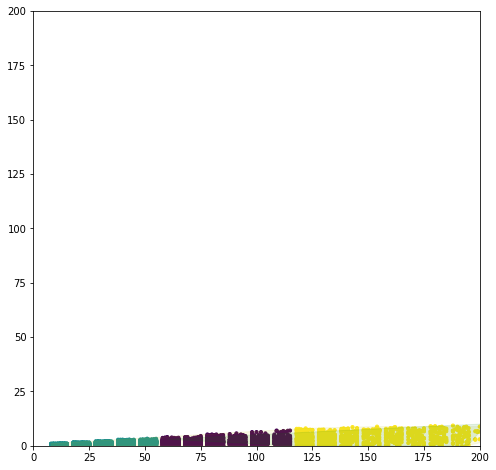

In [ ]:
from scipy.spatial import ConvexHull
import numpy as np

colors = ['y', 'green']

fig, ax = plt.subplots(1, figsize=(8,8))
# plot data
plt.scatter(df_X_mi_optimal.Income, df_X_mi_optimal.CCAvg, c=df_X_mi_optimal['Cluster Labels'], alpha = 10, s=10)

# plot centers
# plt.scatter(cen_x, cen_y, marker='^', c=colors, s=70)

# draw enclosure
for i in df_X_mi_optimal['True Labels'].unique():
    points = df_X_mi_optimal[df_X_mi_optimal['True Labels'] == i][['Income', 'CCAvg']].values
    # get convex hull
    hull = ConvexHull(points)
    # get x and y coordinates
    # repeat last point to close the polygon
    x_hull = np.append(points[hull.vertices,0],
                       points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],
                       points[hull.vertices,1][0])
    # plot shape
    plt.fill(x_hull, y_hull, alpha=0.1, c=colors[i])

plt.xlim(0,200)
plt.ylim(0,200)